In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
import pyflct

In [2]:
from matplotlib import font_manager

font_path = '/home/flow/.fonts/cmunrm.ttf'  # Your font path goes here
#font_path = '/usr/share/fonts/opentype/urw-base35/NimbusRoman-Italic.otf'
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)
mpl.rcParams["font.size"] = 12
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()
plt.rc('axes', unicode_minus=False)

In [3]:
mpl.get_cachedir()

'/home/flow/.cache/matplotlib'

<h1>17.7.2024.</h1>

<h2>Primeri koji pokazuju šta vidimo na različitim talasnim dužinama</h2>

In [4]:
# Ucitavamo podatke iz simulacije i sinteticke podatke
from astropy.io import fits
#cube_r = fits.open("qs_ph_disk_center.fits")[0].data
#cube_synth = fits.open("qs_ph_disk_center_synth.fits")[0].data

In [5]:
I = np.copy(cube_synth[:,:,0,:])
# W/m^2/Hz/srad I_/lambda/I_qs

In [6]:
cube_r.shape

(11, 71, 1536, 1536)

In [7]:
cube_synth.shape

(1536, 1536, 4, 201)

In [8]:
I.shape

(1536, 1536, 201)

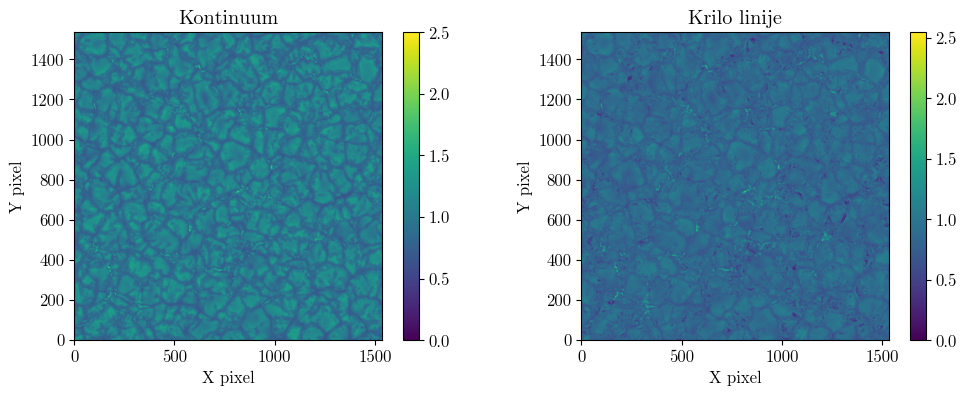

In [9]:
plt.figure(figsize=[12,4])
plt.subplot(121)
plt.title("Kontinuum")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,0].T, origin='lower',vmin = 0, vmax = 2.5)
plt.colorbar()
plt.subplot(122)
plt.title("Krilo linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,37].T, origin='lower', )
plt.colorbar()
plt.savefig("Krilo_linije.png", dpi = 300)

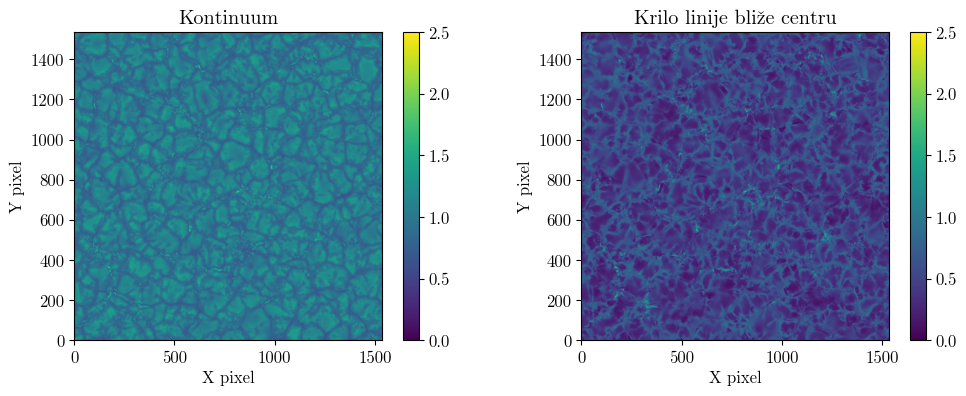

In [10]:
plt.figure(figsize=[12,4])
plt.subplot(121)
plt.title("Kontinuum")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,0].T, origin='lower',vmin = 0, vmax = 2.5)
plt.colorbar()
plt.subplot(122)
plt.title("Krilo linije bliže centru")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,44].T, origin='lower', vmin = 0, vmax = 2.5)
plt.colorbar()
plt.savefig("BKrilo_linije.png", dpi = 300)

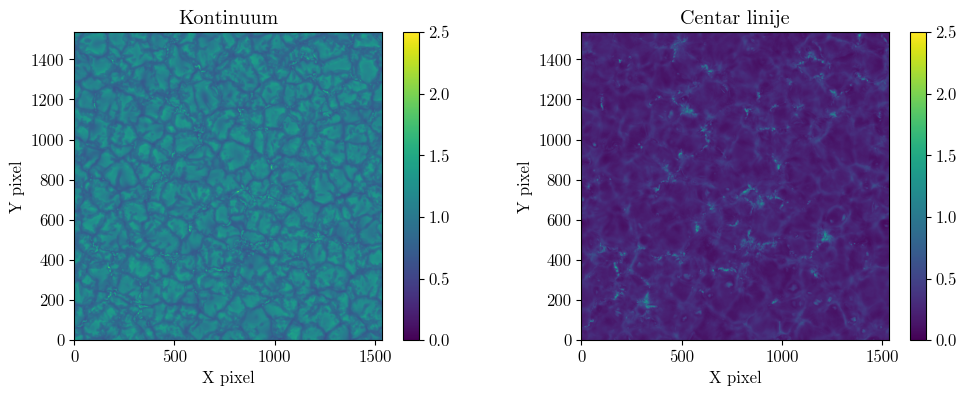

In [11]:
plt.figure(figsize=[12,4])
plt.subplot(121)
plt.title("Kontinuum")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,0].T, origin='lower',vmin = 0, vmax = 2.5)
plt.colorbar()
plt.subplot(122)
plt.title("Centar linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,51].T, origin='lower',vmin = 0, vmax = 2.5 )
plt.colorbar()
plt.savefig("Centar_linije.png", dpi = 300)

In [12]:
atmos = cube_r.transpose(0, 3, 2, 1)

In [13]:
Bz = atmos[4] * np.cos(np.radians(atmos[6]))

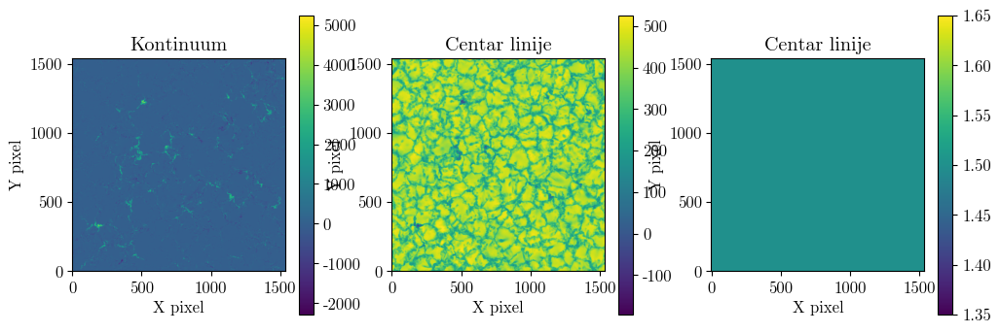

In [14]:
plt.figure(figsize=[12,4])                            # atmos[0] tau
plt.subplot(131)                                      # atmos[1] temp
plt.title("Kontinuum")                                # atmos[2]
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(Bz[:,:,0], origin='lower')
plt.colorbar()

plt.subplot(132)
plt.title("Centar linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(atmos[8,:,:,0], origin='lower')
plt.colorbar()

plt.subplot(133)
plt.title("Centar linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(atmos[0,:,:,0], origin='lower')
plt.colorbar()

In [5]:
# Ucitavamo tau_slice za tau = 1
first = np.fromfile("tau_slice_1.000.000000", dtype = "float32")
first_ = first[4:].reshape(11, 1536, 1536)
Bz_1 = first_[7,:,:]
Bz_1 = Bz_1 * np.sqrt(4*np.pi)

In [6]:
V_z_sim = first_[1,:,:]

In [7]:
V_x_sim = first_[10,:,:]

In [8]:
T = first_[8,:,:]

In [9]:
import muram as muram

In [10]:
Int=muram.MuramIntensity('',0)

In [11]:
testcube = np.fromfile("tau_slice_1.000.000000", dtype = "float32")

In [19]:
path = ''
data1 = muram.read_slice(path, 0, 'tau', '0.100' )
test1 = np.copy(data1[0][5,:,:] * np.sqrt(4 * np.pi))

FileNotFoundError: [Errno 2] No such file or directory: 'tau_slice_0.100.000000'

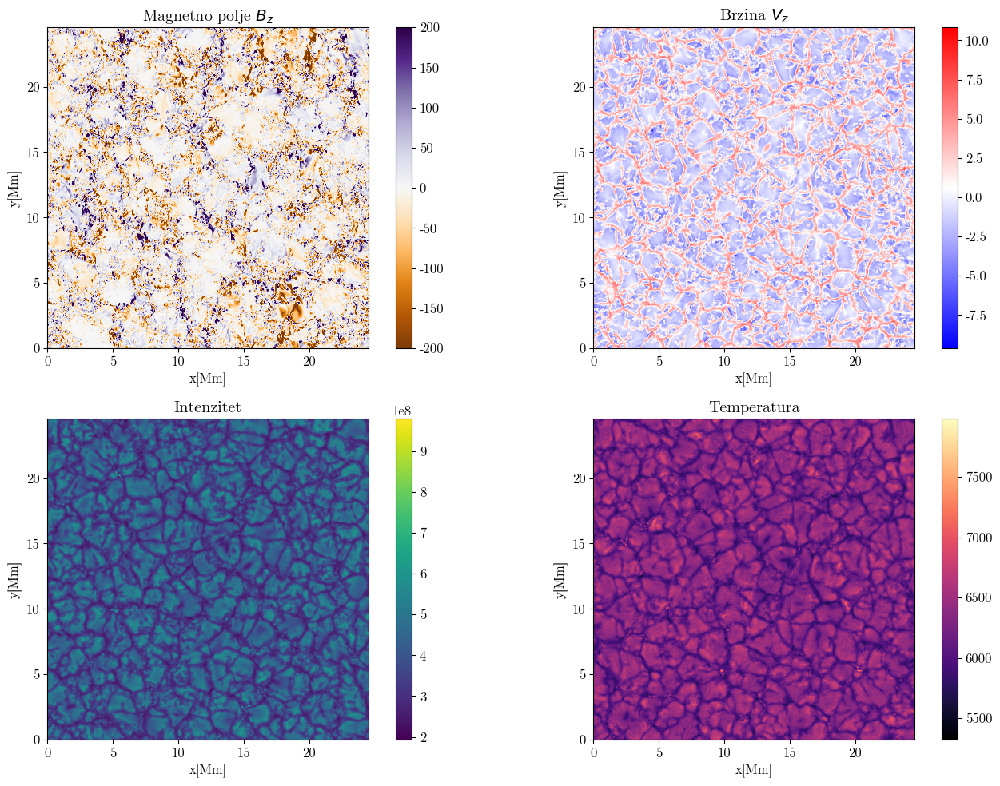

In [139]:
plt.figure(figsize=[14, 10])       
#plt.suptitle("Parametri na početku simulacije")# atmos[0] tau
plt.subplot(221)                                      # atmos[1] temp
plt.title("Magnetno polje $B_z$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Bz_1[:,:], origin='lower', cmap = "PuOr", extent = (0, 24.536, 0, 24.536), vmin = -200, vmax = 200)
plt.colorbar()

plt.subplot(222)
plt.title("Brzina $V_z$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(-V_z_sim[:,:]/1E5, origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536))
plt.colorbar()

plt.subplot(223)
plt.title("Intenzitet")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Int[:,:], origin='lower', extent = (0, 24.536, 0, 24.536))
plt.colorbar()

plt.subplot(224)
plt.title("Temperatura")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(T[:,:], origin='lower', cmap = "magma", extent = (0, 24.536, 0, 24.536))
plt.colorbar()
plt.tight_layout()
plt.savefig("Pocetak_sim.png", bbox_inches = 'tight', dpi = 60)

In [12]:
from matplotlib.colors import LogNorm

In [13]:
import os

In [14]:
path=os.getcwd()
B_unit=np.sqrt(4*np.pi)
iter = 15000

In [24]:
tau_levels=[1,0.1,1e-2,1e-3,1e-4,1e-5,1e-6]
tau=[]
for level in tau_levels:
    tau.append(muram.MuramTauSlice(path,iter, level))

FileNotFoundError: [Errno 2] No such file or directory: '/home/flow/Documents/ISSI_2D/tau_slice_1.000.015000'

<h1>24. 7. 2024.</h1>

<h2>Novi plot</h2>

ValueError: x and y can be no greater than 2D, but have shapes (1536,) and (1536, 1536, 201)

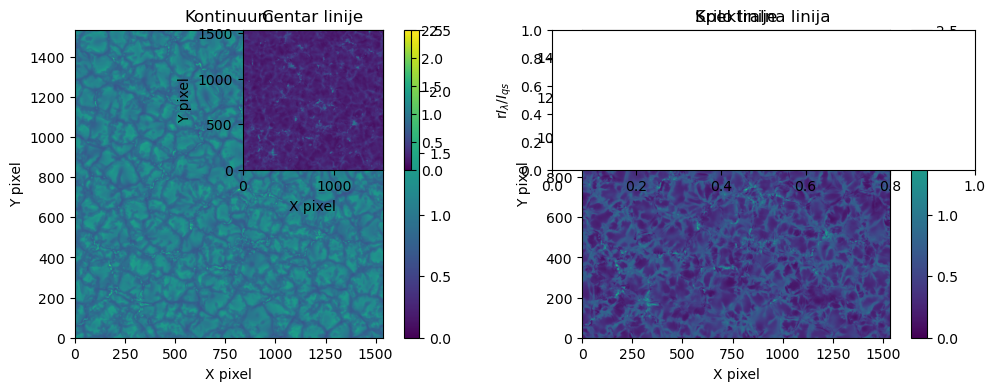

In [25]:
plt.figure(figsize=[12,4])
plt.subplot(121)
plt.title("Kontinuum")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,0].T, origin='lower',vmin = 0, vmax = 2.5)
plt.colorbar()

plt.subplot(122)
plt.title("Krilo linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,44].T, origin='lower',vmin = 0, vmax = 2.5 )
plt.colorbar()

plt.subplot(221)
plt.title("Centar linije")
plt.xlabel("X pixel")
plt.ylabel("Y pixel")
plt.imshow(I[:,:,51].T, origin = 'lower', vmin = 0, vmax = 2.5)
plt.colorbar()

plt.subplot(222)
plt.title("Spektralna linija")
plt.xlabel("")
plt.ylabel("r$I_\lambda/I_{qs}$")
plt.plot(I)
#plt.savefig("Centar_linije.png", dpi = 300)

In [14]:
Inte = np.linspace(630.1, 630.3, num = 201, endpoint = True)*1E-9

In [15]:
print(Inte)

[6.30100e-07 6.30101e-07 6.30102e-07 6.30103e-07 6.30104e-07 6.30105e-07
 6.30106e-07 6.30107e-07 6.30108e-07 6.30109e-07 6.30110e-07 6.30111e-07
 6.30112e-07 6.30113e-07 6.30114e-07 6.30115e-07 6.30116e-07 6.30117e-07
 6.30118e-07 6.30119e-07 6.30120e-07 6.30121e-07 6.30122e-07 6.30123e-07
 6.30124e-07 6.30125e-07 6.30126e-07 6.30127e-07 6.30128e-07 6.30129e-07
 6.30130e-07 6.30131e-07 6.30132e-07 6.30133e-07 6.30134e-07 6.30135e-07
 6.30136e-07 6.30137e-07 6.30138e-07 6.30139e-07 6.30140e-07 6.30141e-07
 6.30142e-07 6.30143e-07 6.30144e-07 6.30145e-07 6.30146e-07 6.30147e-07
 6.30148e-07 6.30149e-07 6.30150e-07 6.30151e-07 6.30152e-07 6.30153e-07
 6.30154e-07 6.30155e-07 6.30156e-07 6.30157e-07 6.30158e-07 6.30159e-07
 6.30160e-07 6.30161e-07 6.30162e-07 6.30163e-07 6.30164e-07 6.30165e-07
 6.30166e-07 6.30167e-07 6.30168e-07 6.30169e-07 6.30170e-07 6.30171e-07
 6.30172e-07 6.30173e-07 6.30174e-07 6.30175e-07 6.30176e-07 6.30177e-07
 6.30178e-07 6.30179e-07 6.30180e-07 6.30181e-07 6.

In [16]:
I_sp = np.copy(cube_synth[:,:,0,:])

NameError: name 'cube_synth' is not defined

NameError: name 'I' is not defined

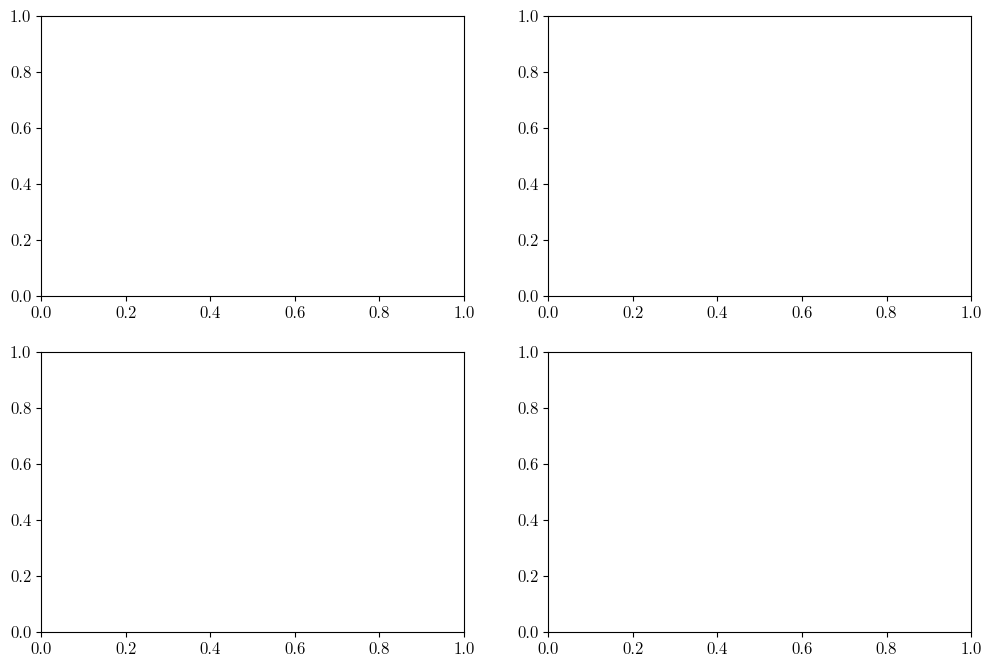

In [17]:
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(221)
ax2 = f.add_subplot(222)
ax3 = f.add_subplot(223)
ax4 = f.add_subplot(224)

im = ax.imshow(I[:,:,0].T, origin = "lower", cmap = "inferno", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
ax.set_title("Kontinuum")
ax.set(ylabel = "y[Mm]")
f.colorbar(im)

im2 = ax2.imshow(I[:,:,44].T, origin = "lower", cmap = "inferno", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
ax2.set_title("Krilo linije")
#ax2.set(ylabel = "y[Mm]")
#fig.colorbar(im2)

im3 = ax3.imshow(I[:,:,51].T, origin = "lower", cmap = "inferno", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
ax3.set_title("Centar linije")
ax3.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
f.colorbar(im3)

im4 = ax4.plot(Inte[0:100], I_sp[100,100,0:100])
ax4.set_title("Spektralna linija")
ax4.set(xlabel=" $\lambda$[nm]", ylabel = "$I_\lambda/I_{qs}$")

asp = np.diff(ax4.get_xlim())[0] / np.diff(ax4.get_ylim())[0]
asp /= np.abs(np.diff(ax.get_xlim())[0] / np.diff(ax.get_ylim())[0])
ax4.set_aspect(asp)
f.tight_layout()
plt.savefig("AllAtOnce.png", bbox_inches = 'tight')

NameError: name 'I' is not defined

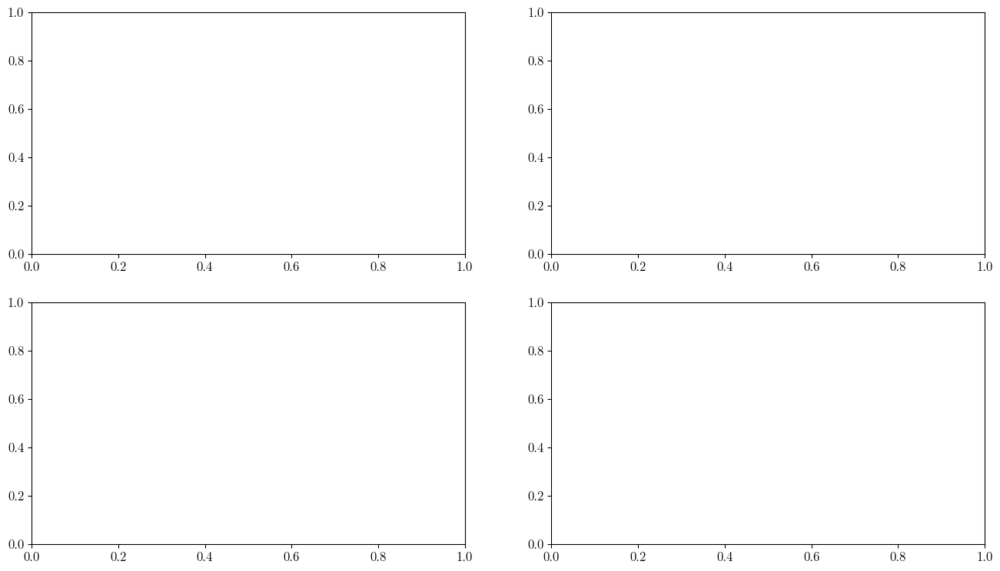

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(16,9))
im = axs[0, 0].imshow(I[:,:,0].T, origin = "lower", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
axs[0, 0].set_title('Kontinuum')
axs[0, 0].set(ylabel = "y[Mm]")
fig.colorbar(im)

im1 = axs[0, 1].imshow(I[:,:,44].T, origin = "lower", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
axs[0, 1].set_title('Krilo linije')
#axs[0, 1].set()
fig.colorbar(im1)

im2 = axs[1, 0].imshow(I[:,:,51].T, origin = "lower", extent = (0, 24.536, 0, 24.536), vmin = 0, vmax = 2.5)
axs[1, 0].set_title('Centar linije')
axs[1, 0].set(xlabel=" x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)

im3 = axs[1, 1].plot(Inte[0:100], I_sp[100,100,0:100])
axs[1, 1].set_title('Spektralna linija')
axs[1, 1].set(xlabel=" $\lambda$[nm]", ylabel = "$I_\lambda/I_{qs}$")
#axs[1, 1].
#63.01 do 63.03 u 201 equal steps
#im3.xticks(Inte[0:100], [630.1, 630.125, 630.15, 630.175, 630.2])
fig.tight_layout()
#plt.savefig("AllAtOnce.png", dpi = 300)
#for ax in axs.flat:
    #ax.set(xlabel='x-label', ylabel='y-label')

# Hide x labels and tick labels for top plots and y ticks for right plots.
#for ax in axs.flat:
    #ax.label_outer()

In [ ]:
plt.plot(I_sp[100,100,0:100])

In [15]:
import muram as mio

In [16]:
from scipy.ndimage import gaussian_filter

In [17]:
# Define function for temporal averaging
def temporal_avg(data_in, start, end):
    tmp_avg = np.mean(data_in[start:end], axis = 0)
    return tmp_avg

In [18]:
# Let us load the FLCT derived velocities for all given combinations, starting with 1200km
Vx_1200 = fits.open("pyFLCT_fwhm_1200_dt_30_Inte_tracked.fits")[0].data
Vy_1200 = fits.open("pyFLCT_fwhm_1200_dt_30_Inte_tracked.fits")[1].data

In [19]:
Vx_600 = fits.open("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")[0].data
Vy_600 = fits.open("pyFLCT_fwhm_600_dt_30_Inte_tracked.fits")[1].data

In [20]:
Vx_300 = fits.open("pyFLCT_fwhm_300_dt_30_Inte_tracked.fits")[0].data
Vy_300 = fits.open("pyFLCT_fwhm_300_dt_30_Inte_tracked.fits")[1].data

In [21]:
Vx_100 = fits.open("pyFLCT_fwhm_100_dt_30_Inte_tracked.fits")[0].data
Vy_100 = fits.open("pyFLCT_fwhm_100_dt_30_Inte_tracked.fits")[1].data

In [22]:
# After that, we shall load velocities taken directly from simulation
Vx = fits.open("Velocities_TAU_1_0.fits")[1].data # Vy from Velocities.fits as originally thought
Vy = fits.open("Velocities_TAU_1_0.fits")[0].data # Vx from Velocities.fits as originally thought
Vx = Vx.transpose(0, 2, 1)
Vy = Vy.transpose(0, 2, 1)

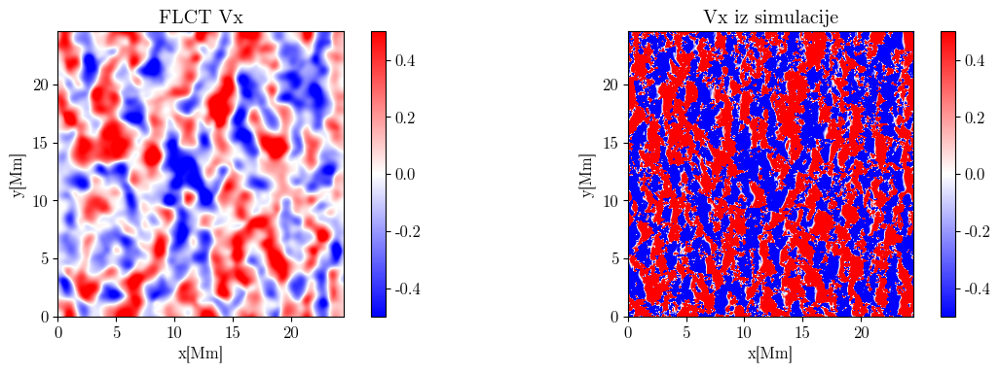

In [23]:
fig = plt.figure(figsize = (12,4))
#fig.suptitle("FLCT Vx i Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_1200[0, :, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx[0, :, :]/1E5, origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax2.set_title("Vx iz simulacije") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
fig.tight_layout()
plt.savefig("Obicno_1.png", bbox_inches = 'tight', dpi = 75)

In [24]:
precision = 0.5

In [25]:
diff_1 = Vy_1200[0, :, :] - Vy[0, :, :]/1E5
MSE_1 = diff_1/precision
MSE_1 = MSE_1**2
chi_1 = np.mean(MSE_1)
print(chi_1)

19.020097402605955


In [26]:
I1 = mio.MuramIntensity("",0)
I2 = mio.MuramIntensity("",500)

In [26]:
delta_t = 10.0 * 3
pixelsize = 16.0
sigma = 1200.0 / 1.665 / pixelsize
velx, vely, vm = pyflct.flct(I1, I2, delta_t, pixelsize, sigma, quiet = True)

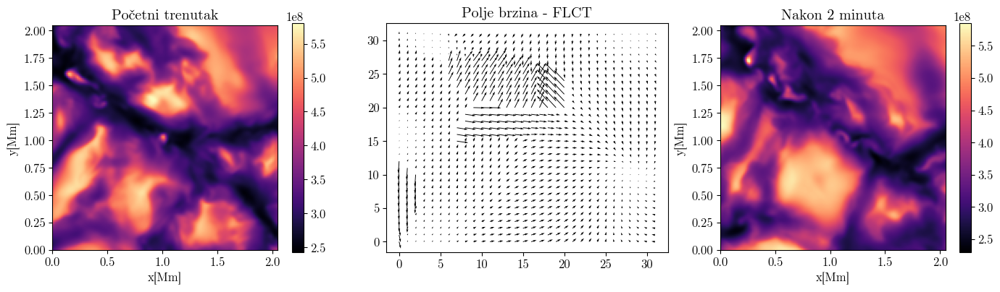

In [27]:
i_start = 0
i_end = 128
j_start = 0
j_end = 128

X = np.arange(0, 32, 1)
Y = np.arange(0, 32, 1)
U, V = np.meshgrid(X, Y)

# Plotting the first image
fig = plt.figure(figsize=(14, 4))

ax1 = fig.add_subplot(131)
plt.imshow(I1[i_start:i_end, j_start:j_end], origin="lower", cmap='magma', extent = (0, 2.048, 0, 2.048))
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
plt.colorbar()
ax1.set_title("Početni trenutak")

# Plot the 2D flow field
ax2 = fig.add_subplot(132)
ax2.quiver(U[i_start:i_end, j_start:j_end], V[i_start:i_end, j_start:j_end], \
           velx[i_start:i_end:4, j_start:j_end:4], vely[i_start:i_end:4, j_start:j_end:4])
ax2.set_title("Polje brzina - FLCT")

# Plot the shifted image
ax3 = fig.add_subplot(133)
plt.imshow(I2[i_start:i_end, j_start:j_end], origin="lower", cmap='magma', extent = (0, 2.048, 0, 2.048))
ax3.set_title("Nakon 2 minuta")
ax3.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
plt.colorbar()
fig.tight_layout()
plt.savefig("Strelice.png", dpi = 100)

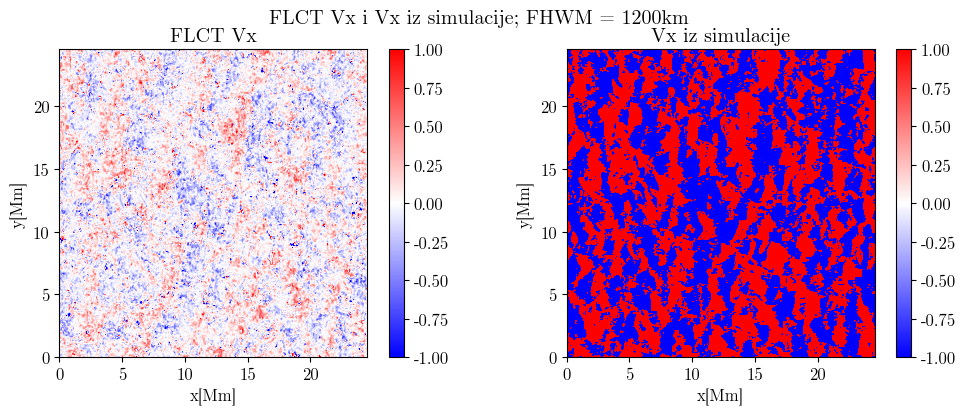

In [27]:
fig = plt.figure(figsize = (12,4))
fig.suptitle("FLCT Vx i Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_100[0, :, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
ax1.set_title("FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx[0, :, :], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
ax2.set_title("Vx iz simulacije") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
plt.savefig("Obicno100.png", dpi = 300)

In [26]:
from scipy.stats import pearsonr

In [27]:
r1 = pearsonr(Vx_1200[0].flatten(), (Vx[0]/1E5).flatten()) 
print(r1)

PearsonRResult(statistic=0.5154332682926646, pvalue=0.0)


In [28]:
print(Vx_1200[0])

[[-0.01797221 -0.01688774 -0.01563985 ...  0.09938417  0.09691719
   0.09452011]
 [-0.01677594 -0.01568878 -0.0144394  ...  0.09928727  0.09685184
   0.09448503]
 [-0.01551059 -0.01441953 -0.01316748 ...  0.09920457  0.09680067
   0.09446409]
 ...
 [ 0.11240957  0.11909895  0.12616328 ...  0.15814602  0.15473942
   0.15138552]
 [ 0.11269886  0.11938411  0.12644478 ...  0.15944064  0.15599977
   0.15261156]
 [ 0.11302784  0.11970986  0.12676771 ...  0.16073211  0.15725727
   0.15383499]]


In [29]:
print(Vx[0])

[[-224837.3   -222417.64  -217183.69  ... -153327.14  -187781.39
  -220134.98 ]
 [-179852.86  -209333.6   -228464.92  ...  -65101.24  -106549.13
  -146278.58 ]
 [ -83375.68  -118222.88  -161366.05  ...  -62125.34   -58084.707
   -63448.43 ]
 ...
 [-226953.23  -225089.95  -218489.16  ... -248813.17  -249960.3
  -242598.84 ]
 [-226163.25  -223950.9   -217057.84  ... -227726.14  -234089.98
  -228571.69 ]
 [-216765.06  -221887.34  -217918.66  ... -215321.92  -231324.22
  -225241.33 ]]


In [32]:
Mean_vx = fits.open("Mean_velocities_TAU_0_1.fits")[1].data # Vy from Velocities.fits as originally thought
Mean_vy = fits.open("Mean_velocities_TAU_0_1.fits")[0].data # Vx from Velocities.fits as originally thought
Mean_vx = Mean_vx.transpose(0, 2, 1)
Mean_vy = Mean_vy.transpose(0, 2, 1)

FileNotFoundError: [Errno 2] No such file or directory: 'Mean_velocities_TAU_0_1.fits'

NameError: name 'Mean_vx' is not defined

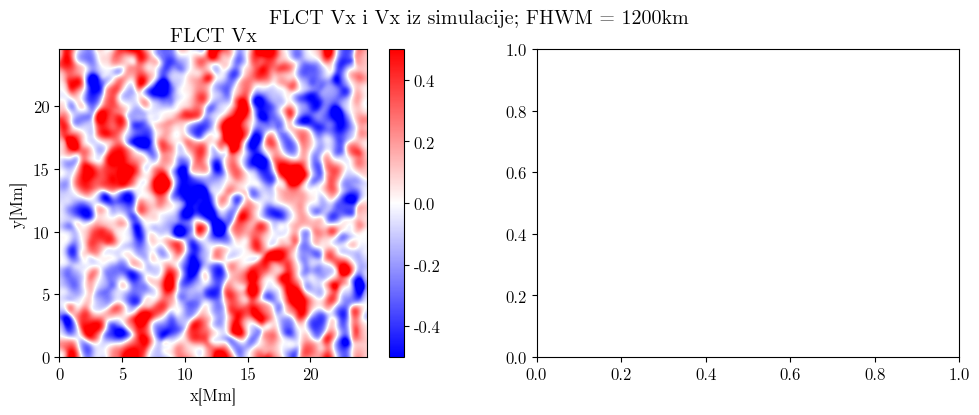

In [33]:
fig = plt.figure(figsize = (12,4))
fig.suptitle("FLCT Vx i Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_1200[0, :, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Mean_vx[0,:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax2.set_title("Vx iz simulacije") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
plt.savefig("Pro_avg.png", dpi = 300)

In [30]:
# Our next task is to to average velocities using previously defined function
# We shall use the first half of total slices for that
Vx_mean_sim = temporal_avg(Vx, 0, 90)
Vx_mean_sim = Vx_mean_sim/1E5

Vy_mean_sim = temporal_avg(Vy, 0, 90)
Vy_mean_sim = Vy_mean_sim/1E5

In [31]:
Vx_FLCT_1200 = temporal_avg(Vx_1200, 0, 90)
Vy_FLCT_1200 = temporal_avg(Vy_1200, 0, 90)

In [32]:
Vx_FLCT_600 = temporal_avg(Vx_600, 0, 90)
Vy_FLCT_600 = temporal_avg(Vy_600, 0, 90)

In [33]:
Vx_FLCT_300 = temporal_avg(Vx_300, 0, 90)
Vy_FLCT_300 = temporal_avg(Vy_300, 0, 90)

In [34]:
Vx_FLCT_100 = temporal_avg(Vx_100, 0, 90)
Vy_FLCT_100 = temporal_avg(Vy_100, 0, 90)

In [35]:
# sigma = 35
Vx_filtered35 = gaussian_filter(Vx_mean_sim, 35, mode = "wrap")
Vy_filtered35 = gaussian_filter(Vy_mean_sim, 35, mode = "wrap")

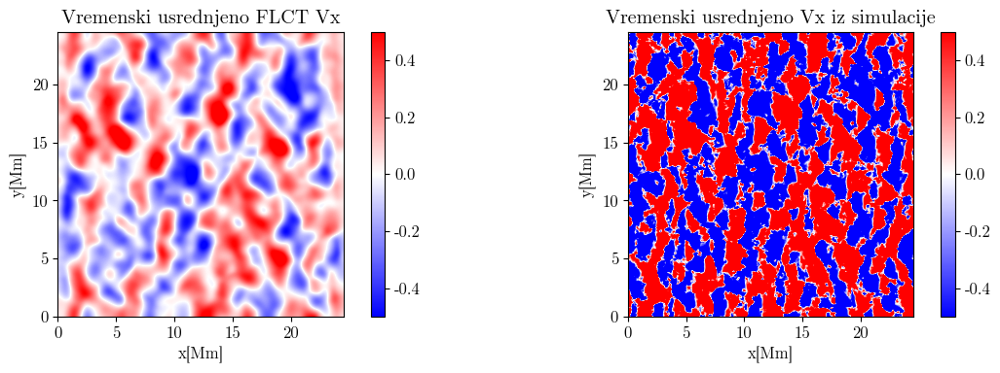

In [36]:
fig = plt.figure(figsize = (12,4))
#fig.suptitle("FLCT Vx i Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_FLCT_1200[:, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_mean_sim[:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax2.set_title("Vremenski usrednjeno Vx iz simulacije") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
fig.tight_layout()
plt.savefig("Time_avg_1.png", bbox_inches = 'tight', dpi = 75)

In [37]:
diff_2 = Vy_FLCT_1200[:, :] - Vy_mean_sim[:, :]
MSE_2 = diff_2/precision
MSE_2 = MSE_2**2
chi_2 = np.mean(MSE_2)
print(chi_2)

7.224041282717315


In [38]:
r2 = pearsonr(Vx_FLCT_1200.flatten(), Vx_mean_sim.flatten())
print(r2)

PearsonRResult(statistic=0.7504590365546118, pvalue=0.0)


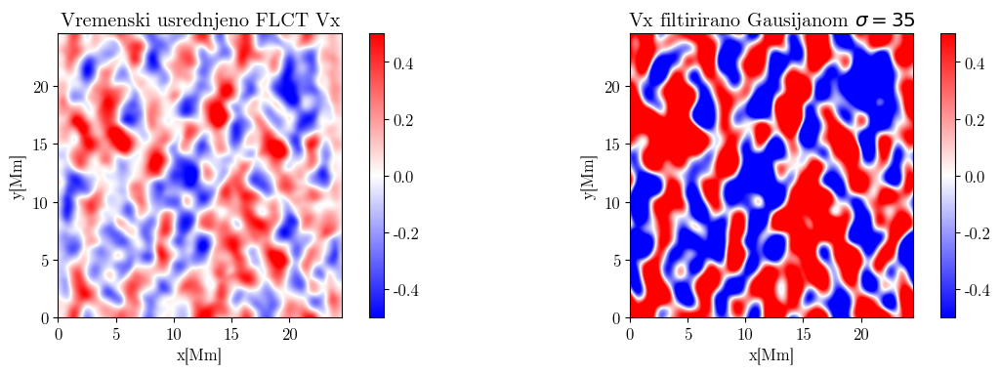

In [41]:
fig = plt.figure(figsize = (12,4))
#fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_FLCT_1200[:, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_filtered35[:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax =0.5)
ax2.set_title("Vx filtirirano Gausijanom $\sigma = 35$") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
fig.tight_layout()
plt.savefig("Fin_1.png", bbox_inches = 'tight', dpi = 75)

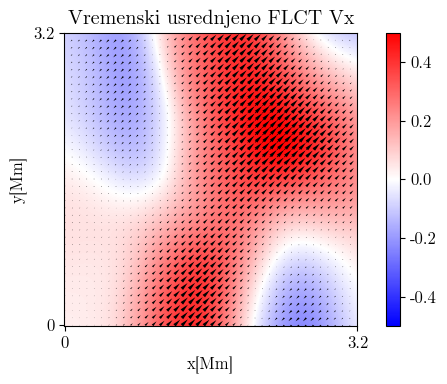

In [159]:
fig = plt.figure(figsize = (12,4))
#fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
#im1 = ax1.imshow(Vx_FLCT_1200[0:64, 0:64], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")

xmin = 0
xmax = 200
ymin = 0
ymax=  200

Bgtx_disp = Vx_FLCT_1200[ymin:ymax,xmin:xmax]
Bgty_disp = Vx_FLCT_1200[ymin:ymax,xmin:xmax]
Bgtz_disp = Vx_FLCT_1200[ymin:ymax,xmin:xmax]

ysize,xsize = np.shape(Bgtx_disp)

stride = 5


xmaxind = int(round(xsize/stride))
ymaxind = int(round(ysize/stride))

xstr, ystr = np.meshgrid(stride*np.arange(0,xmaxind),stride*np.arange(0,ymaxind))
im1 = ax1.imshow(Bgtz_disp, origin='lower',cmap='bwr', vmin = -0.5, vmax = 0.5)
ax1.quiver(xstr,ystr,Bgtx_disp[::stride,::stride],Bgty_disp[::stride,::stride], headwidth = 5, headaxislength = 12, headlength = 12)
plt.xticks([0,200], [0, 2*1.6])
plt.yticks([0,200], [0, 2*1.6])
fig.colorbar(im1)


fig.tight_layout()
plt.savefig("QuiverxB_png", bbox_inches = 'tight', dpi = 125)

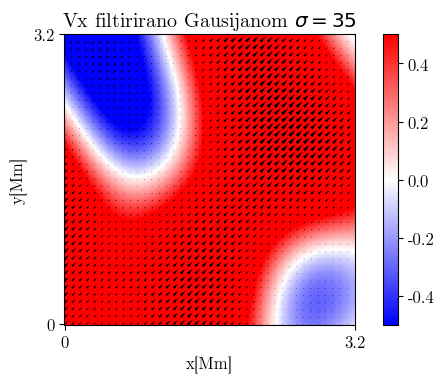

In [41]:
fig = plt.figure(figsize = (12,4))
#fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
#im1 = ax1.imshow(Vx_FLCT_1200[0:64, 0:64], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vx filtirirano Gausijanom $\sigma = 35$") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")

xmin = 0
xmax = 200
ymin = 0
ymax=  200

Bgtx_disp = Vx_filtered35[ymin:ymax,xmin:xmax]
Bgty_disp = Vx_filtered35[ymin:ymax,xmin:xmax]
Bgtz_disp = Vx_filtered35[ymin:ymax,xmin:xmax]

ysize,xsize = np.shape(Bgtx_disp)

stride = 5


xmaxind = int(round(xsize/stride))
ymaxind = int(round(ysize/stride))

xstr, ystr = np.meshgrid(stride*np.arange(0,xmaxind),stride*np.arange(0,ymaxind))
im1 = ax1.imshow(Bgtz_disp, origin='lower',cmap='bwr', vmin = -0.5, vmax = 0.5)
ax1.quiver(xstr,ystr,Bgtx_disp[::stride,::stride],Bgty_disp[::stride,::stride], headwidth = 5, headaxislength = 12, headlength = 12)
plt.xticks([0,200], [0, 2*1.6])
plt.yticks([0,200], [0, 2*1.6])
fig.colorbar(im1)


fig.tight_layout()
plt.savefig("QuiverxBF_png", bbox_inches = 'tight', dpi = 75)

In [142]:


      
# 2D image with vectors overlain
# Needs gridspec & subplot() from matplotlib, imported here as .plt


# Cropping input arrays to show interesting portion
#--------------------------------------------------

'''
xmin = 75
xmax = 225
ymin = 75
ymax=  225
'''

xmin = 100
xmax = 300
ymin = 125
ymax=  275

Bgtx_disp = Bgtx_obs[ymin:ymax,xmin:xmax]
Bgty_disp = Bgty_obs[ymin:ymax,xmin:xmax]
Bgtz_disp = Bgtz_obs[ymin:ymax,xmin:xmax]

ysize,xsize = np.shape(Bgtx_disp)

stride = 5


xmaxind = int(round(xsize/stride))
ymaxind = int(round(ysize/stride))

xstr, ystr = np.meshgrid(stride*np.arange(0,xmaxind),stride*np.arange(0,ymaxind))

'''
Bgth = np.sqrt(Bgtx_disp**2 + Bgty_disp**2)

#where_big_bgth= np.where(Bgth[y,x] > 125)
where_small_bgth= np.where(Bgth[y,x] < 100)

Bgtx_disp[where_small_bgth] = 0
Bgty_disp[where_small_bgth] = 0
'''

plt.imshow(Bgtz_disp, origin = 'lower')
plt.quiver(xstr,ystr,Bgtx_disp[::stride,::stride],Bgty_disp[::stride,::stride])

plt.savefig('vector.png',dpi = 100)


# Set min. & max. levels for saturation
#--------------------------------------------------
ltmaxsat = 1000
ltminsat = -ltmaxsat
gtmaxsat = 500
gtminsat = -gtmaxsat
deltaminsat = -250
deltamaxsat = 250
gtdeltafactor = 0.25   


fig = plt.figure(figsize = (11,8.5))
gs = gridspec.GridSpec(2,4, height_ratios=[1,1], wspace=.15, hspace=.05)

# Top Row
axarr = plt.subplot(gs[0,0])
axarr.imshow(Btx_obs, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Btx Observed')

axarr = plt.subplot(gs[0,1])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(smBtx_obs, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Smooth Btx Observed')

axarr = plt.subplot(gs[0,2])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(Btx_model, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Btx Model')

axarr = plt.subplot(gs[0,3])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(deltaBtx, origin = 'lower', vmin = deltaminsat * gtdeltafactor, vmax = deltamaxsat * gtdeltafactor)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Btx Model - Observed')

# Bottom Row
axarr = plt.subplot(gs[1,0])
axarr.imshow(Bty_obs, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Bgty Observed')

axarr = plt.subplot(gs[1,1])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(smBty_obs, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Smooth Bgty Observed')

axarr = plt.subplot(gs[1,2])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(Bty_model, origin = 'lower', vmin = gtminsat, vmax = gtmaxsat)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Bgty Model')

axarr = plt.subplot(gs[1,3])
axarr.tick_params(axis='y', which = 'both', left = True, right = False, labelleft = False, direction = 'in')
axarr.imshow(deltaBty, origin = 'lower', vmin = deltaminsat * gtdeltafactor, vmax = deltamaxsat * gtdeltafactor)
axarr.contour(smBgtz_display, 0, origin = 'lower', cmap ='Reds', linewidths = 1)
plt.title('Bgty Model - Observed')


    



NameError: name 'Bgtx_obs' is not defined

In [133]:
diff_3 = Vy_FLCT_1200[:, :] - Vy_filtered35[:, :]
MSE_3 = diff_3/precision
MSE_3 = MSE_3**2
chi_3 = np.mean(MSE_3)
print(chi_3)

0.9637315112523248


In [134]:
r3 = pearsonr(Vx_FLCT_1200.flatten(), Vx_filtered35.flatten())
print(r3)

PearsonRResult(statistic=0.9403599475124971, pvalue=0.0)


In [135]:
r_1200y1 = pearsonr(Vy_1200[0].flatten(), Vy[0].flatten()) 
print(r_1200y1)

PearsonRResult(statistic=0.5113081581086343, pvalue=0.0)


In [136]:
r_1200y2 = pearsonr(Vy_FLCT_1200.flatten(), Vy_mean_sim.flatten()) 
print(r_1200y2)

PearsonRResult(statistic=0.7411221461513798, pvalue=0.0)


In [137]:
r_1200y3 = pearsonr(Vy_FLCT_1200.flatten(),Vy_filtered35.flatten()) 
print(r_1200y3)

PearsonRResult(statistic=0.9311753322376419, pvalue=0.0)


NameError: name 'I' is not defined

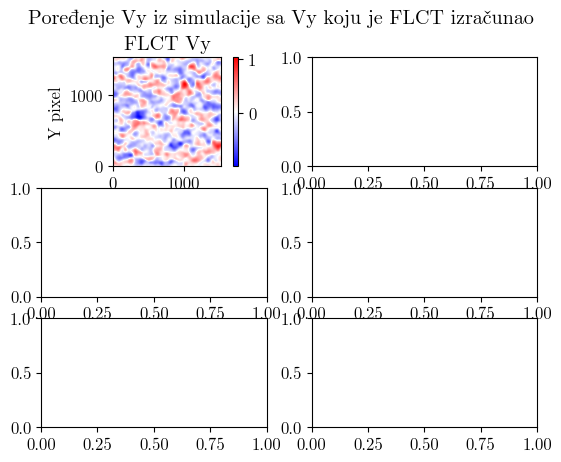

In [49]:
fig, axs = plt.subplots(3, 2)
plt.suptitle("Poređenje Vy iz simulacije sa Vy koju je FLCT izračunao")
im = axs[0, 0].imshow(Vy_1200[0,:,:], origin = "lower", cmap = "bwr")
axs[0, 0].set_title('FLCT Vy')
axs[0, 0].set(xlabel=" X pixel", ylabel = "Y pixel")
fig.colorbar(im)

im1 = axs[0, 1].imshow(I[:,:,44].T, origin = "lower", vmin = 0, vmax = 2.5)
axs[0, 1].set_title('Krilo linije')
axs[0, 1].set(xlabel=" X pixel", ylabel = "Y pixel")
fig.colorbar(im1)

im2 = axs[1, 0].imshow(I[:,:,51].T, origin = "lower", vmin = 0, vmax = 2.5)
axs[1, 0].set_title('Centar linije')
axs[1, 0].set(xlabel=" X pixel", ylabel = "Y pixel")
fig.colorbar(im2)

im3 = axs[1, 1].plot(Inte[0:100], I_sp[100,100,0:100])
axs[1, 1].set_title('Spektralna linija')
axs[1, 1].set(xlabel=" $\lambda$[nm]", ylabel = "$I_\lambda/I_{qs}$")
#63.01 do 63.03 u 201 equal steps
#im3.xticks(Inte[0:100], [630.1, 630.125, 630.15, 630.175, 630.2])
fig.tight_layout()
#plt.savefig("AllAtOnce.png", dpi = 300)

<h1>1. 8. 2024.</h1>

In [138]:
# sigma = 22.5
Vx_filtered22 = gaussian_filter(Vx_mean_sim, 22.5, mode = "wrap")
Vy_filtered22 = gaussian_filter(Vy_mean_sim, 22.5, mode = "wrap")

In [139]:
# sigma = 11
Vx_filtered11 = gaussian_filter(Vx_mean_sim, 11.25, mode = "wrap")
Vy_filtered11 = gaussian_filter(Vy_mean_sim, 11.25, mode = "wrap")

In [140]:
# sigma = 3
Vx_filtered3 = gaussian_filter(Vx_mean_sim, 3.75, mode = "wrap")
Vy_filtered3 = gaussian_filter(Vy_mean_sim, 3.75, mode = "wrap")

In [141]:
diff_4 = Vy_600[0, :, :] - Vy[0, :, :]/1E5
MSE_4 = diff_4/precision
MSE_4 = MSE_4**2
chi_4 = np.mean(MSE_4)
print(chi_4)

18.40358834453461


In [142]:
diff_5 = Vy_FLCT_600[:, :] - Vy_mean_sim[:, :]
MSE_5 = diff_5/precision
MSE_5 = MSE_5**2
chi_5 = np.mean(MSE_5)
print(chi_5)

6.860860873783426


In [143]:
diff_6 = Vy_FLCT_600[:, :] - Vy_filtered22[:, :]
MSE_6 = diff_6/precision
MSE_6 = MSE_6**2
chi_6 = np.mean(MSE_6)
print(chi_6)

2.054069461014956


In [144]:
diff_7 = Vy_300[0, :, :] - Vy[0, :, :]/1E5
MSE_7 = diff_7/precision
MSE_7 = MSE_7**2
chi_7 = np.mean(MSE_7)
print(chi_7)

18.665591785540542


In [145]:
diff_8 = Vy_FLCT_300[:, :] - Vy_mean_sim[:, :]
MSE_8 = diff_8/precision
MSE_8 = MSE_8**2
chi_8 = np.mean(MSE_8)
print(chi_8)

7.113519121976643


In [146]:
diff_9 = Vy_FLCT_300[:, :] - Vy_filtered11[:, :]
MSE_9 = diff_9/precision
MSE_9 = MSE_9**2
chi_9 = np.mean(MSE_9)
print(chi_9)

4.486363835267314


In [147]:
diff_10 = Vy_100[0, :, :] - Vy[0, :, :]/1E5
MSE_10 = diff_10/precision
MSE_10 = MSE_10**2
chi_10 = np.mean(MSE_10)
print(chi_10)

20.29071338860144


In [148]:
diff_11 = Vy_FLCT_100[:, :] - Vy_mean_sim[:, :]
MSE_11 = diff_11/precision
MSE_11 = MSE_11**2
chi_11 = np.mean(MSE_11)
print(chi_11)

8.097628633066607


In [149]:
diff_12 = Vy_FLCT_100[:, :] - Vy_filtered3[:, :]
MSE_12 = diff_12/precision
MSE_12 = MSE_12**2
chi_12 = np.mean(MSE_12)
print(chi_12)

7.449083048285626


In [150]:
r_600_1 = pearsonr(Vx_600[0].flatten(), Vx[0].flatten())
print(r_600_1)

PearsonRResult(statistic=0.5616806448613417, pvalue=0.0)


In [151]:
r_600_2 = pearsonr(Vx_FLCT_600.flatten(), Vx_mean_sim.flatten())
print(r_600_2)

PearsonRResult(statistic=0.8166860184925668, pvalue=0.0)


In [152]:
r_600_3 = pearsonr(Vx_FLCT_600.flatten(), Vx_filtered22.flatten())
print(r_600_3)

PearsonRResult(statistic=0.9371533945326095, pvalue=0.0)


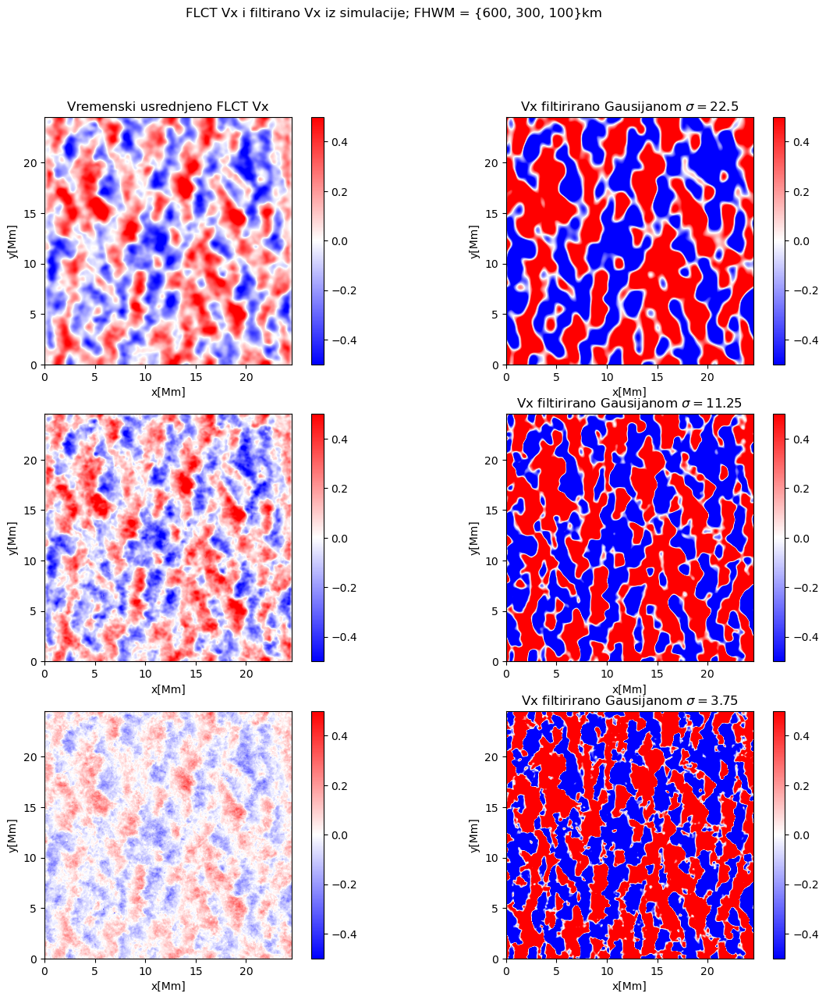

In [58]:
plt.figure(figsize=[14, 14])       
plt.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = {600, 300, 100}km")# atmos[0] tau
plt.subplot(321)                                      # atmos[1] temp
plt.title("Vremenski usrednjeno FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(322)
plt.title("Vx filtirirano Gausijanom $\sigma = 22.5$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered22[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(323)
#plt.title("Vremenski usrednjeno FLCT Vx")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(324)
plt.title("Vx filtirirano Gausijanom $\sigma = 11.25$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered11[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(325)                                      # atmos[1] temp
#plt.title("Vremenski usrednjeno FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_100[:, :][:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(326)                                      # atmos[1] temp
plt.title("Vx filtirirano Gausijanom $\sigma = 3.75$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered3[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.savefig("600_300_100.png", dpi = 300)

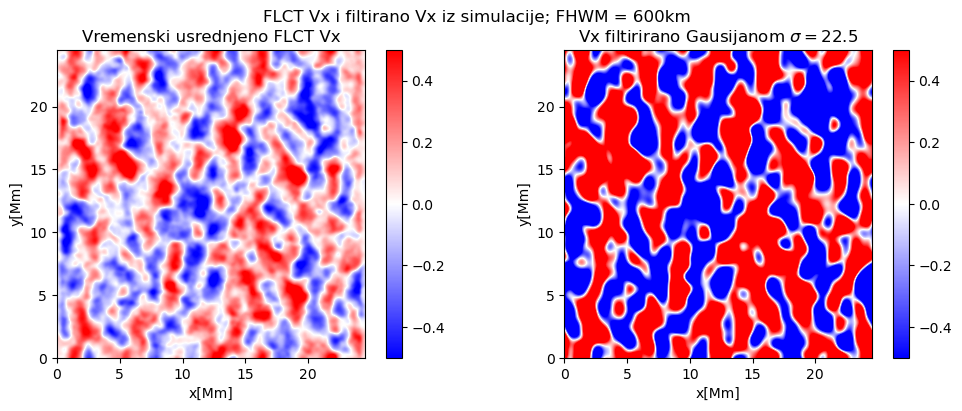

In [59]:
fig = plt.figure(figsize = (12,4))
fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 600km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_FLCT_600[:, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_filtered22[:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax =0.5)
ax2.set_title("Vx filtirirano Gausijanom $\sigma = 22.5$") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
plt.savefig("Fin600.png", dpi = 300)

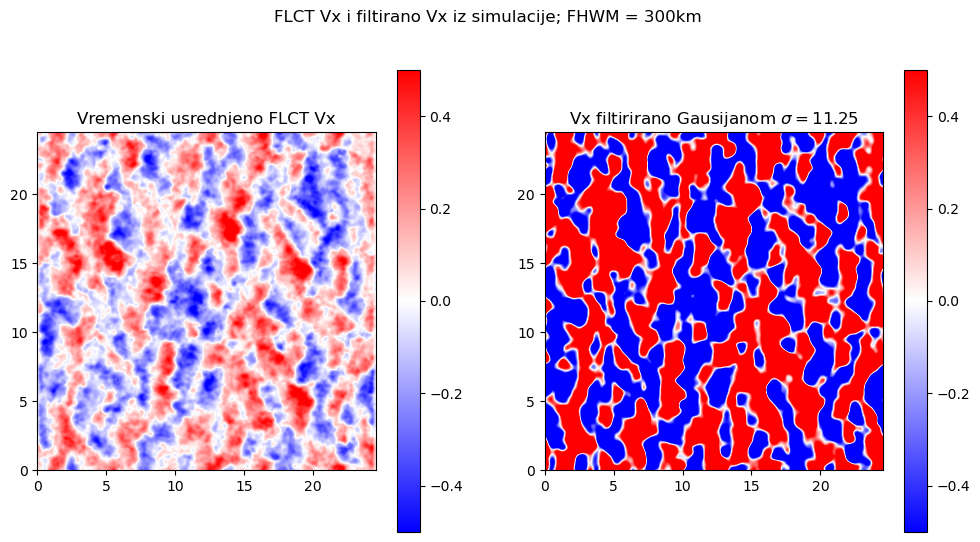

In [60]:
fig = plt.figure(figsize = (12,6))
fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 300km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_FLCT_300[:, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_filtered11[:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax =0.5)
ax2.set_title("Vx filtirirano Gausijanom $\sigma = 11.25$") 
fig.colorbar(im2)
plt.savefig("Fin300.png", dpi = 300)

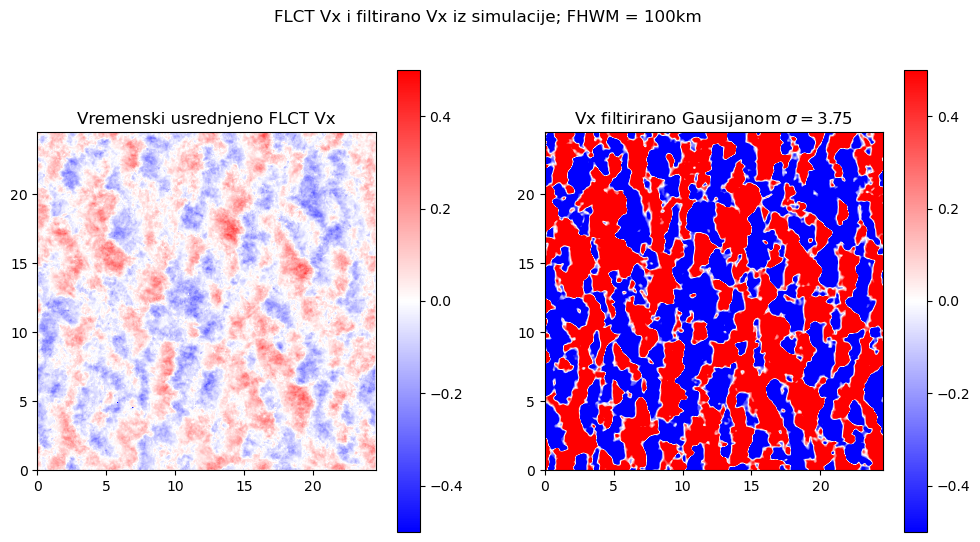

In [61]:
fig = plt.figure(figsize = (12,6))
fig.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = 100km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_FLCT_100[:, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
ax1.set_title("Vremenski usrednjeno FLCT Vx") 
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_filtered3[:,:], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax =0.5)
ax2.set_title("Vx filtirirano Gausijanom $\sigma = 3.75$") 
fig.colorbar(im2)
plt.savefig("Fin100.png", dpi = 300)

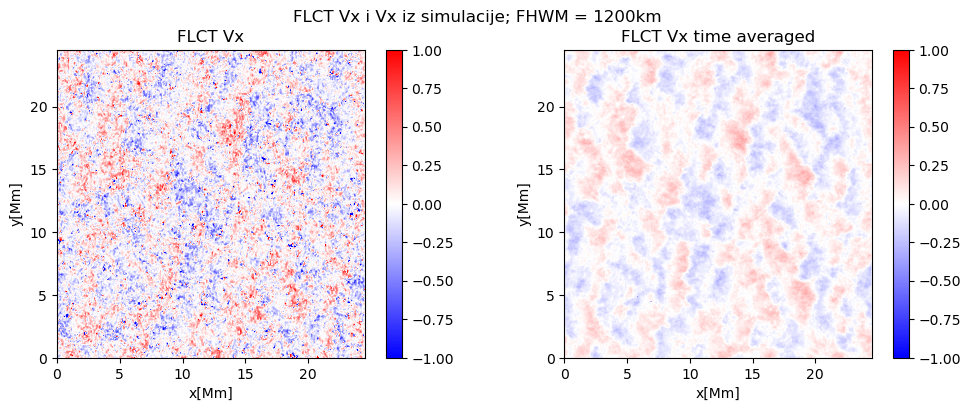

In [62]:
fig = plt.figure(figsize = (12,4))
fig.suptitle("FLCT Vx i Vx iz simulacije; FHWM = 1200km")
ax1 = fig.add_subplot(121)
im1 = ax1.imshow(Vx_100[0, :, :], origin='lower',cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
ax1.set_title("FLCT Vx") 
ax1.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im1)

ax2 = fig.add_subplot(122)
im2 = ax2.imshow(Vx_FLCT_100[:, :], origin='lower', cmap='bwr', extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
ax2.set_title("FLCT Vx time averaged") 
ax2.set(xlabel = "x[Mm]", ylabel = "y[Mm]")
fig.colorbar(im2)
plt.savefig("100comp.png", dpi = 300)

In [63]:
np.shape(Vx_FLCT_100)

(1536, 1536)

In [64]:
r_600_y1 = pearsonr(Vy_600[0].flatten(), Vy[0].flatten())
print(r_600_y1)

PearsonRResult(statistic=0.5505031119634194, pvalue=0.0)


In [65]:
r_600_y2 = pearsonr(Vy_FLCT_600.flatten(), Vy_mean_sim.flatten())
print(r_600_y2)

PearsonRResult(statistic=0.8115350756931927, pvalue=0.0)


In [66]:
r_600_y3 = pearsonr(Vy_FLCT_600.flatten(), Vy_filtered22.flatten())
print(r_600_y3)

PearsonRResult(statistic=0.9322307125590705, pvalue=0.0)


In [67]:
r_300_x1 = pearsonr(Vx_300[0].flatten(), Vx[0].flatten())
print(r_300_x1)

PearsonRResult(statistic=0.5134004470982595, pvalue=0.0)


In [68]:
r_300_y1 = pearsonr(Vy_300[0].flatten(), Vy[0].flatten())
print(r_300_y1)

PearsonRResult(statistic=0.506910234395423, pvalue=0.0)


In [69]:
r_300_x2 = pearsonr(Vx_FLCT_300.flatten(), Vx_mean_sim.flatten())
print(r_300_x2)

PearsonRResult(statistic=0.831863775673682, pvalue=0.0)


In [70]:
r_300_y2 = pearsonr(Vy_FLCT_300.flatten(), Vy_mean_sim.flatten())
print(r_300_y2)

PearsonRResult(statistic=0.8297201275880941, pvalue=0.0)


In [71]:
r_300_x3 = pearsonr(Vx_FLCT_300.flatten(), Vx_filtered11.flatten())
print(r_300_x3)

PearsonRResult(statistic=0.8988507576878647, pvalue=0.0)


In [72]:
r_300_y3 = pearsonr(Vy_FLCT_300.flatten(), Vy_filtered11.flatten())
print(r_300_y3)

PearsonRResult(statistic=0.8973128082608655, pvalue=0.0)


In [73]:
r_100_x1 = pearsonr(Vx_100[0].flatten(), Vx[0].flatten())
print(r_100_x1)

PearsonRResult(statistic=0.19337654032182475, pvalue=0.0)


In [74]:
r_100_y1 = pearsonr(Vy_100[0].flatten(), Vy[0].flatten())
print(r_100_y1)

PearsonRResult(statistic=0.22371770484267106, pvalue=0.0)


In [75]:
r_100_x2 = pearsonr(Vx_FLCT_100.flatten(), Vx_mean_sim.flatten())
print(r_100_x2)

PearsonRResult(statistic=0.7783533330721142, pvalue=0.0)


In [76]:
r_100_y2 = pearsonr(Vy_FLCT_100.flatten(), Vy_mean_sim.flatten())
print(r_100_y2)

PearsonRResult(statistic=0.781100965726532, pvalue=0.0)


In [77]:
r_300_x3 = pearsonr(Vx_FLCT_100.flatten(), Vx_filtered3.flatten())
print(r_300_x3)

PearsonRResult(statistic=0.7951076227215373, pvalue=0.0)


In [78]:
r_300_y3 = pearsonr(Vy_FLCT_100.flatten(), Vy_filtered3.flatten())
print(r_300_y3)

PearsonRResult(statistic=0.7981563423601727, pvalue=0.0)


<h1>6.8.2024.</h1>

<h2>Scatter plot za brzine</h2>

In [79]:
from scipy.stats import linregress

In [89]:
x_niz = [Vx_FLCT_1200, Vx_FLCT_600, Vx_FLCT_300, Vx_FLCT_100]

In [90]:
y_niz = [Vx_filtered35, Vx_filtered22, Vx_filtered11, Vx_filtered3]

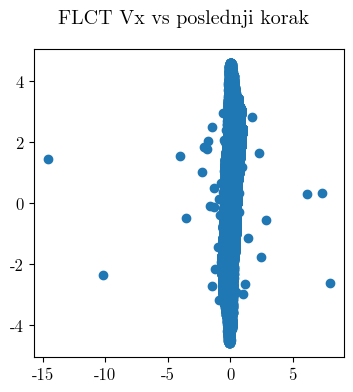

In [90]:
fig = plt.figure(figsize=(4,4))
plt.scatter(x_niz, y_niz)
plt.suptitle("FLCT Vx vs poslednji korak")
plt.savefig("FLCTVx_vs_Filtered.png", dpi = 300)

In [91]:
x_niz = np.asarray(x_niz)
y_niz = np.asarray(y_niz)

In [92]:
linregress(x_niz.flatten(),y_niz.flatten())

LinregressResult(slope=4.0734375303687305, intercept=0.019751286351194053, rvalue=0.6989939179669878, pvalue=0.0, stderr=0.0013565944804131323, intercept_stderr=0.00027109034294919273)

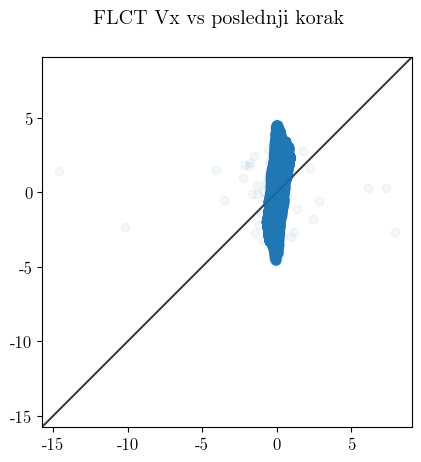

In [93]:
fig, ax = plt.subplots()
plt.suptitle("FLCT Vx vs poslednji korak")
ax.scatter(x_niz, y_niz, alpha = 0.05)
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
plt.savefig("FLCTVx_vs_Filtered_granice.png", dpi = 300)

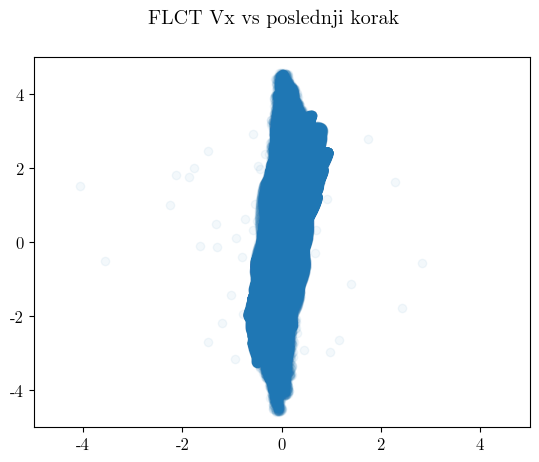

In [94]:
fig, ax = plt.subplots()
plt.suptitle("FLCT Vx vs poslednji korak")
ax.scatter(x_niz, y_niz, alpha = 0.05)
#m, b, *_ = linregress(x_niz.flatten(), y_niz.flatten())
#ax.plot(xy1=(0, b), slope=m, label=f'$y = {m:.1f}x {b:+.1f}$')
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
#ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
#ax.plot(-5*0.001356594480413132, 5*0.001356594480413132, '--k')
#ax.set_aspect('equal')
#ax.set_xlim(lims)
#ax.set_ylim(lims)
ax.set_xlim([-5,5])
ax.set_ylim([-5,5])
plt.savefig("FLCTVx_vs_Filtered_lin.png", dpi = 300)

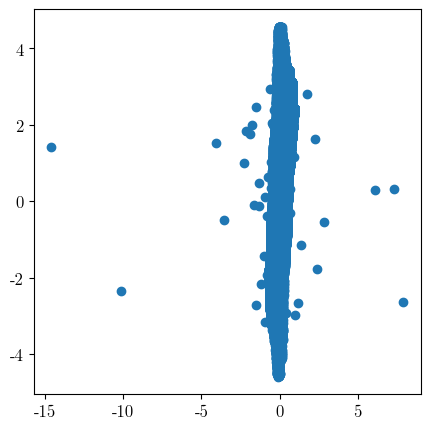

In [95]:
fig = plt.figure(figsize = (5,5))
plt.scatter(x_niz, y_niz)
plt.plot(-5*0.001356594480413132, 5*0.001356594480413132, '--k')
plt.show()

In [96]:
np.mean(Vx_FLCT_1200)

0.023316832298826445

In [97]:
x_novo = np.asarray([np.mean(Vx_FLCT_1200), np.mean(Vx_FLCT_600), np.mean(Vx_FLCT_300), np.mean(Vx_FLCT_100)])

In [98]:
y_novo = np.asarray([np.mean(Vx_filtered35), np.mean(Vx_filtered22), np.mean(Vx_filtered11), np.mean(Vx_filtered3)])

In [99]:
print(x_novo)

[0.02331683 0.02135523 0.0164052  0.00363323]


In [100]:
print(y_novo)

[0.0856498  0.08564978 0.0856498  0.08564976]


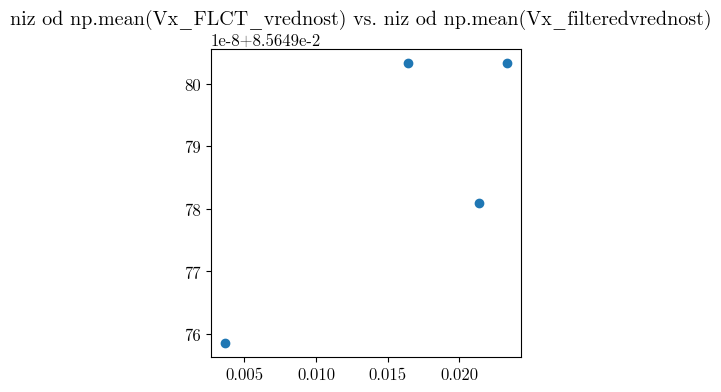

In [101]:
fig = plt.figure(figsize=(4,4))
plt.scatter(x_novo, y_novo)
plt.suptitle("niz od np.mean(Vx_FLCT_vrednost) vs. niz od np.mean(Vx_filteredvrednost)")
plt.savefig("Usrednjeno.png", dpi = 300)

In [102]:
import pandas as pd
import seaborn as sns

ValueError: DataFrame constructor not properly called!

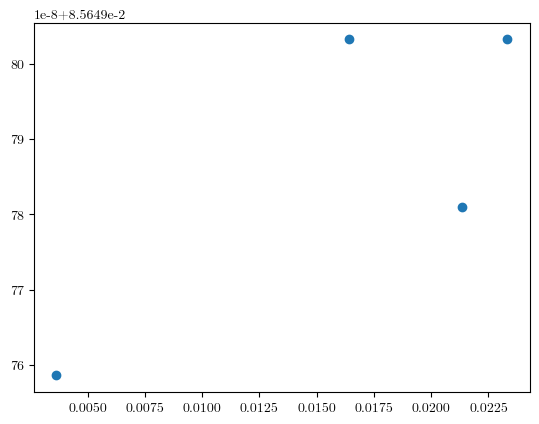

In [103]:
#df = pd.DataFrame(data = [x_novo.flatten(), y_novo.flatten()], columns=['X', 'Y'])
x = plt.scatter(x_novo, y_novo)
df = pd.DataFrame(data = x, columns = ['X', 'Y'])
# plot 
# ====================================
sns.set_style('ticks')
sns.regplot(data = df)
sns.despine()  

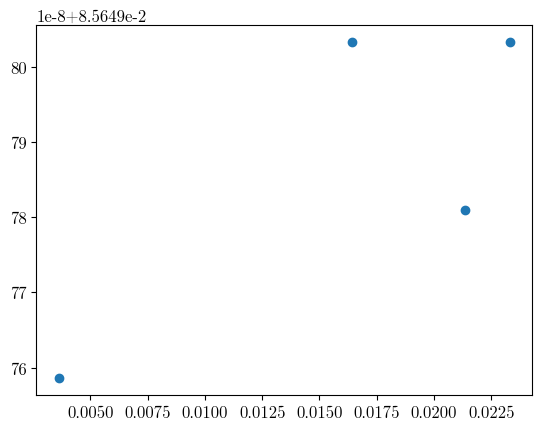

In [103]:
plt.scatter(x_novo, y_novo)
slope = (y_novo[0] - y_novo[1]) / (x_novo[0] - x_novo[1])

In [104]:
print(slope)

1.1394631035168197e-05


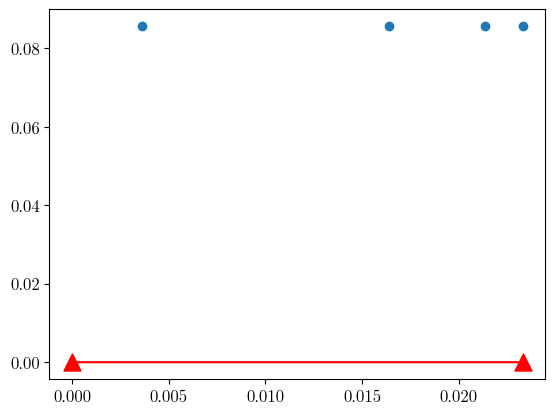

In [105]:
fig, ax = plt.subplots()
ax.scatter(x_novo, y_novo)
x_0 = 0
y_0 = 0

x_1 = x_novo[0]
y_1 = slope * (x_1 - x_0) + y_0
ax.scatter([x_0, x_1], [y_0, y_1], marker='^', s=150, c='r')
ax.plot([x_0, x_1], [y_0, y_1], c='r')    


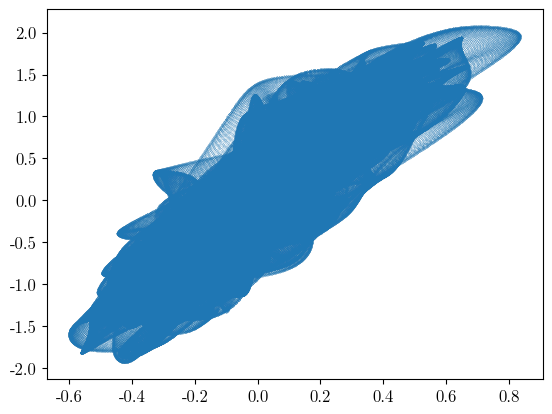

In [106]:
plt.scatter(Vx_FLCT_1200, Vx_filtered35, s = 0.01)

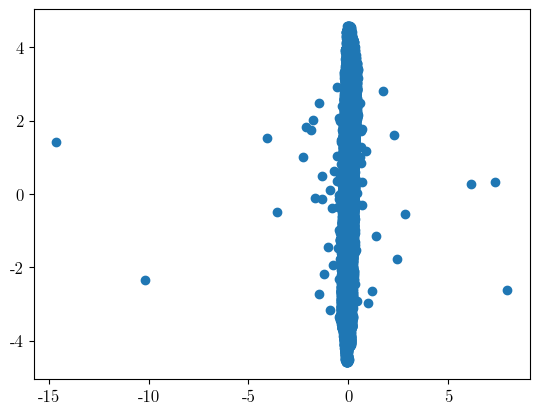

In [107]:
plt.scatter(Vx_FLCT_100, Vx_filtered3)

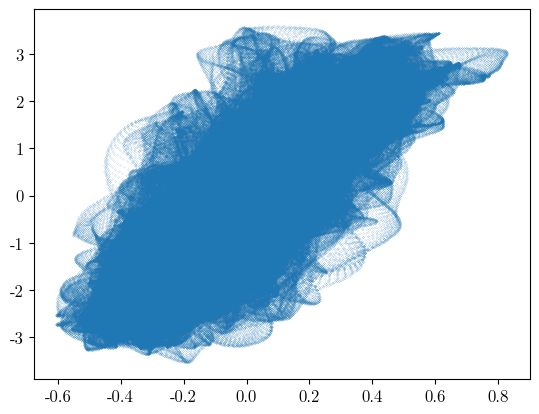

In [108]:
plt.scatter(Vx_FLCT_300, Vx_filtered11, s = 0.01)

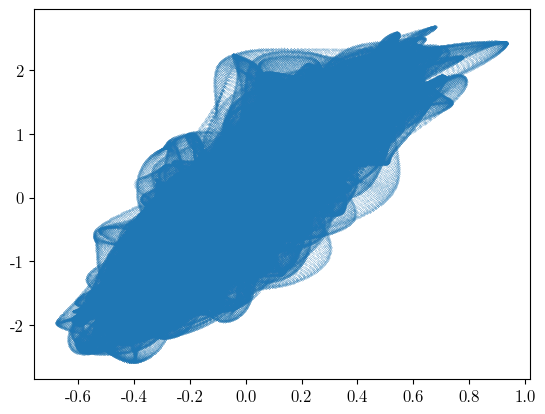

In [109]:
plt.scatter(Vx_FLCT_600, Vx_filtered22, s = 0.01)

In [110]:
linregress(Vx_FLCT_1200.flatten(),Vx_filtered35.flatten())

LinregressResult(slope=2.803189460694804, intercept=0.020288304723971903, rvalue=0.870785256022587, pvalue=0.0, stderr=0.0010304296765650165, intercept_stderr=0.0002279958754033068)

In [111]:
linregress(Vx_FLCT_600.flatten(),Vx_filtered22.flatten())

LinregressResult(slope=3.3927853767630216, intercept=0.013196071058516182, rvalue=0.8506978467075965, pvalue=0.0, stderr=0.001364868522721117, intercept_stderr=0.00033115276100810015)

In [112]:
linregress(Vx_FLCT_300.flatten(),Vx_filtered11.flatten())

LinregressResult(slope=5.013510979759794, intercept=0.0034021421621417136, rvalue=0.7918258066815299, pvalue=0.0, stderr=0.0025175762080940634, intercept_stderr=0.0005162756092444257)

In [113]:
linregress(Vx_FLCT_100.flatten(),Vx_filtered3.flatten())

LinregressResult(slope=10.469381300172094, intercept=0.0476120805234704, rvalue=0.6872969129170668, pvalue=0.0, stderr=0.007203564228796477, intercept_stderr=0.0007150328649976191)

In [114]:
linregress(Vx_filtered3.flatten(), Vx_FLCT_100.flatten())

LinregressResult(slope=0.0451198626701623, intercept=-0.00023127459659392146, rvalue=0.6872969129170668, pvalue=0.0, stderr=3.104518017064179e-05, intercept_stderr=4.6984526583684964e-05)

In [115]:
np.polynomial.polynomial.polyfit(Vx_filtered3.flatten(), Vx_FLCT_100.flatten(), 1)

array([-0.00023128,  0.04511986])

In [116]:
import statsmodels.api 
x = statsmodels.api.add_constant(Vx_filtered3.flatten())
result = statsmodels.api.OLS(Vx_FLCT_100.flatten(), x).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.472
Method:                 Least Squares   F-statistic:                 2.112e+06
Date:                Thu, 15 Aug 2024   Prob (F-statistic):               0.00
Time:                        14:54:17   Log-Likelihood:             2.8581e+06
No. Observations:             2359296   AIC:                        -5.716e+06
Df Residuals:                 2359294   BIC:                        -5.716e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0002    4.7e-05     -4.922      0.0

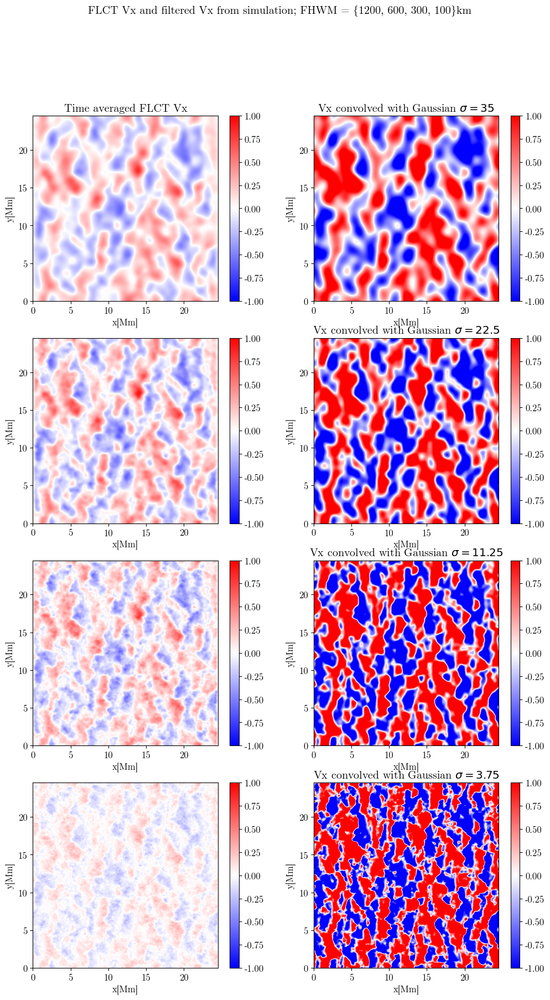

In [178]:
plt.figure(figsize=[12, 20])       
plt.suptitle("FLCT Vx and filtered Vx from simulation; FHWM = {1200, 600, 300, 100}km")# atmos[0] tau

plt.subplot(421)                                      # atmos[1] temp
plt.title("Time averaged FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_1200[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(422)                                      # atmos[1] temp
plt.title("Vx convolved with Gaussian $\sigma = 35$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered35[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(423)                                      # atmos[1] temp
#plt.title("Time averaged FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(424)
plt.title("Vx convolved with Gaussian $\sigma = 22.5$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered22[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(425)
#plt.title("Vremenski usrednjeno FLCT Vx")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(426)
plt.title("Vx convolved with Gaussian $\sigma = 11.25$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered11[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(427)                                      # atmos[1] temp
#plt.title("Vremenski usrednjeno FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_100[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

plt.subplot(428)                                      # atmos[1] temp
plt.title("Vx convolved with Gaussian $\sigma = 3.75$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered3[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar()

fig.tight_layout()
plt.savefig("Comparison.png", dpi = 300)

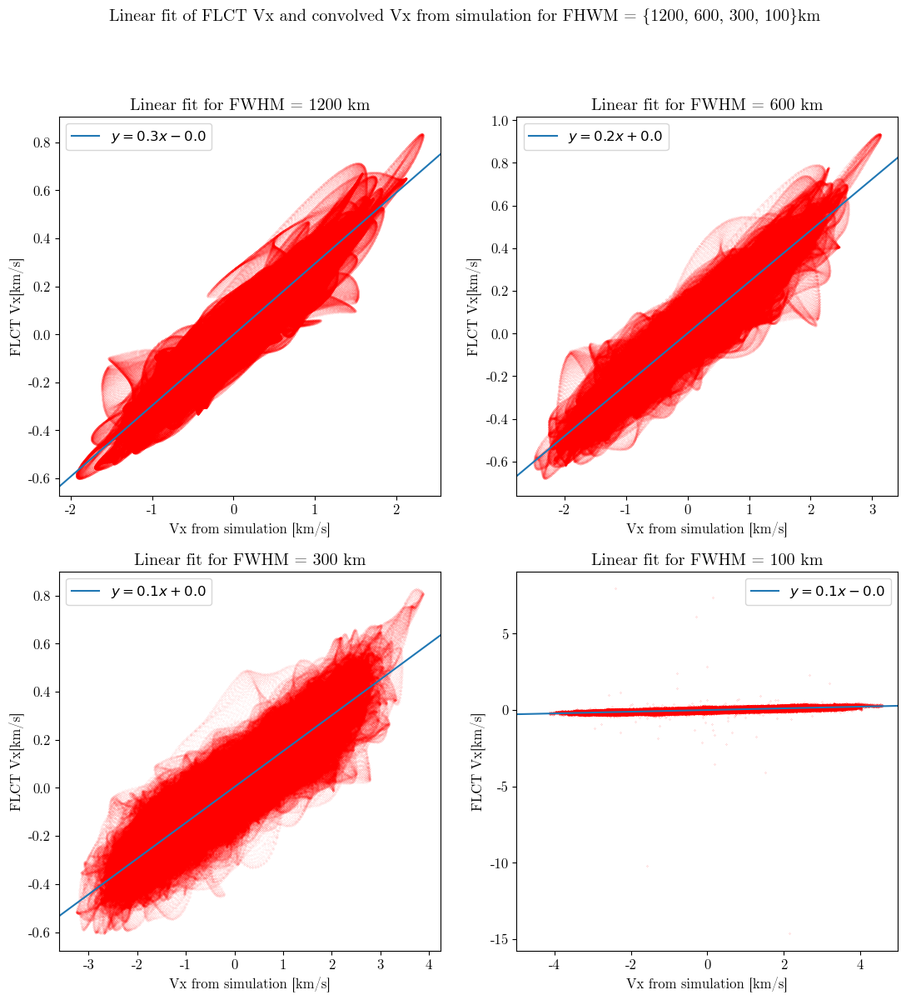

In [179]:
plt.figure(figsize = (13,13))
plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
plt.subplot(221)                                      # atmos[1] temp
plt.title("Linear fit for FWHM = 1200 km")                                # atmos[2]
plt.ylabel("FLCT Vx[km/s]")
plt.xlabel("Vx from simulation [km/s]")
plt.scatter(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten())
plt.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.1f}x {b1:+.1f}$')
plt.legend()

plt.subplot(222)                                      # atmos[1] temp
plt.title("Linear fit for FWHM = 600 km")                                # atmos[2]
plt.ylabel("FLCT Vx[km/s]")
plt.xlabel("Vx from simulation [km/s]")
plt.scatter(Vx_filtered22.flatten(), Vx_FLCT_600.flatten(), s = 0.001, color = "red")
m2, b2, *_ = linregress(Vx_filtered22.flatten(), Vx_FLCT_600.flatten())
plt.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.1f}x {b2:+.1f}$')
plt.legend()

plt.subplot(223)                                      # atmos[1] temp
plt.title("Linear fit for FWHM = 300 km")                                # atmos[2]
plt.ylabel("FLCT Vx[km/s]")
plt.xlabel("Vx from simulation [km/s]")
plt.scatter(Vx_filtered11.flatten(), Vx_FLCT_300.flatten(), s = 0.001, color = "red")
m3, b3, *_ = linregress(Vx_filtered11.flatten(), Vx_FLCT_300.flatten())
plt.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.1f}x {b3:+.1f}$')
plt.legend()

plt.subplot(224)                                      # atmos[1] temp
plt.title("Linear fit for FWHM = 100 km")                                # atmos[2]
plt.ylabel("FLCT Vx[km/s]")
plt.xlabel("Vx from simulation [km/s]")
plt.xlim(-5,5)
plt.xlim(-5,5)
plt.scatter(Vx_filtered3.flatten(), Vx_FLCT_100.flatten(), s = 0.01, color = "red")
m4, b4, *_ = linregress(Vx_filtered3.flatten(), Vx_FLCT_100.flatten())
plt.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.1f}x {b4:+.1f}$')
plt.legend()

fig.tight_layout()
plt.savefig("Linear_fit_FLCT.png", dpi = 300)

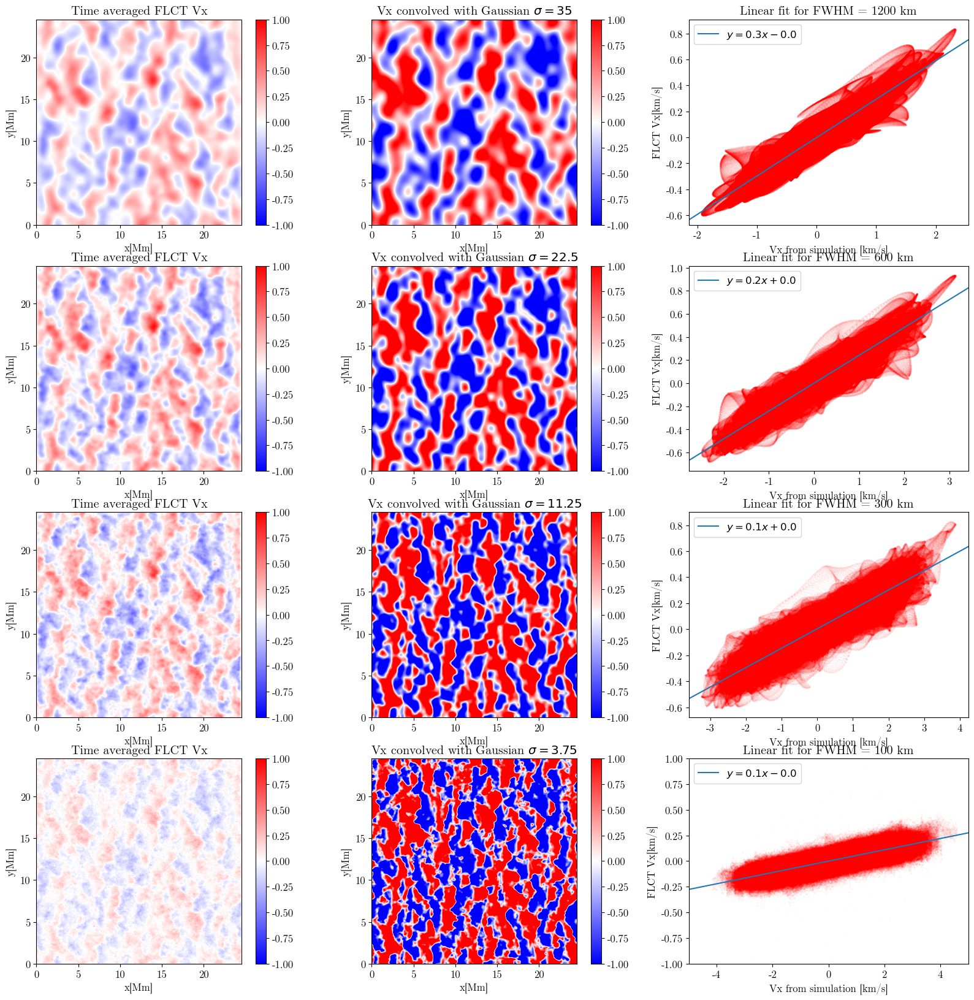

In [180]:
plt.figure(figsize = (20,20))
#plt.suptitle("Linear fit of FLCT Vx and convolved Vx from simulation for FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("Time averaged FLCT Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(Vx_FLCT_1200[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("Vx convolved with Gaussian $\sigma = 35$")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vx_filtered35[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title("Linear fit for FWHM = 1200 km")                                
ax3.set_ylabel("FLCT Vx[km/s]")
ax3.set_xlabel("Vx from simulation [km/s]")
ax3.scatter(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten())
ax3.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.1f}x {b1:+.1f}$')
plt.legend()

ax4 = plt.subplot2grid((4,3), (1,0))
ax4.set_title("Time averaged FLCT Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(Vx_FLCT_600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("Vx convolved with Gaussian $\sigma = 22.5$")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vx_filtered22[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title("Linear fit for FWHM = 600 km")                                
ax6.set_ylabel("FLCT Vx[km/s]")
ax6.set_xlabel("Vx from simulation [km/s]")
ax6.scatter(Vx_filtered22.flatten(), Vx_FLCT_600.flatten(), s = 0.001, color="red")
m2, b2, *_ = linregress(Vx_filtered22.flatten(), Vx_FLCT_600.flatten())
ax6.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.1f}x {b2:+.1f}$')
plt.legend()

ax7 = plt.subplot2grid((4,3), (2,0))
ax7.set_title("Time averaged FLCT Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(Vx_FLCT_300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("Vx convolved with Gaussian $\sigma = 11.25$")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vx_filtered11[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title("Linear fit for FWHM = 300 km")                                
ax9.set_ylabel("FLCT Vx[km/s]")
ax9.set_xlabel("Vx from simulation [km/s]")
ax9.scatter(Vx_filtered11.flatten(), Vx_FLCT_300.flatten(), s = 0.001, color="red")
m3, b3, *_ = linregress(Vx_filtered11.flatten(), Vx_FLCT_300.flatten())
ax9.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.1f}x {b2:+.1f}$')
plt.legend()

ax10 = plt.subplot2grid((4,3), (3,0))
ax10.set_title("Time averaged FLCT Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(Vx_FLCT_100[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("Vx convolved with Gaussian $\sigma = 3.75$")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vx_filtered3[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -1, vmax = 1)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title("Linear fit for FWHM = 100 km")                                
ax12.set_ylabel("FLCT Vx[km/s]")
ax12.set_xlabel("Vx from simulation [km/s]")
ax12.set_xlim(-5,5)
ax12.set_ylim(-1,1)
ax12.scatter(Vx_filtered3.flatten(), Vx_FLCT_100.flatten(), s = 0.001, color="red")
m4, b4, *_ = linregress(Vx_filtered3.flatten(), Vx_FLCT_100.flatten())
ax12.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.1f}x {b4:+.1f}$')
plt.legend()

fig.tight_layout()
plt.savefig("ALL_comp.png", dpi = 300)

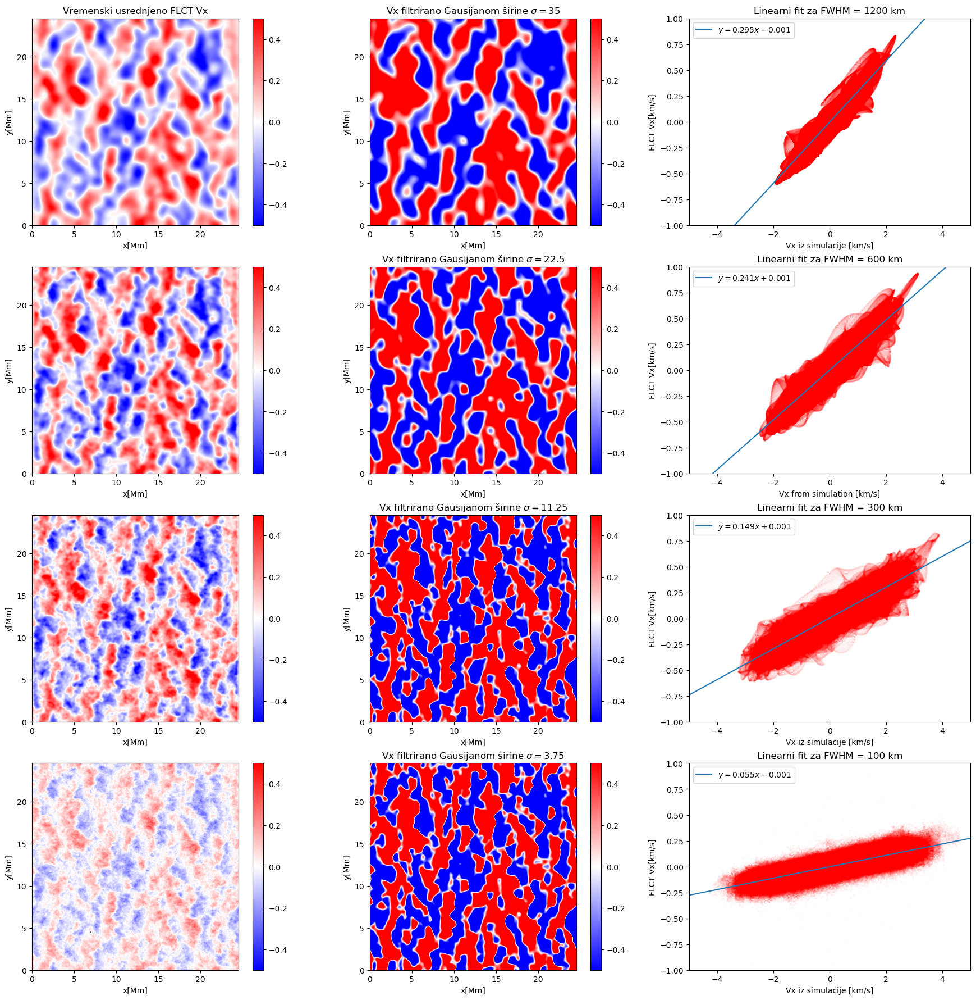

In [80]:
plt.figure(figsize = (22,22))
#plt.suptitle("Poređenje FLCT Vx i filtrirane Vx iz simulacije za FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("Vremenski usrednjeno FLCT Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(Vx_FLCT_1200[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("Vx filtrirano Gausijanom širine $\sigma = 35$")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vx_filtered35[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title("Linearni fit za FWHM = 1200 km")                                
ax3.set_ylabel("FLCT Vx[km/s]")
ax3.set_xlabel("Vx iz simulacije [km/s]")
ax3.set_xlim(-5,5)
ax3.set_ylim(-1,1)
ax3.scatter(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vx_filtered35.flatten(), Vx_FLCT_1200.flatten())
ax3.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.3f}x {b1:+.3f}$')
plt.legend()

ax4 = plt.subplot2grid((4,3), (1,0))
#ax4.set_title("Time averaged FLCT Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(Vx_FLCT_600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("Vx filtrirano Gausijanom širine $\sigma = 22.5$")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vx_filtered22[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title("Linearni fit za FWHM = 600 km")                                
ax6.set_ylabel("FLCT Vx[km/s]")
ax6.set_xlabel("Vx from simulation [km/s]")
ax6.set_xlim(-5,5)
ax6.set_ylim(-1,1)
ax6.scatter(Vx_filtered22.flatten(), Vx_FLCT_600.flatten(), s = 0.001, color="red")
m2, b2, *_ = linregress(Vx_filtered22.flatten(), Vx_FLCT_600.flatten())
ax6.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.3f}x {b2:+.3f}$')
plt.legend()

ax7 = plt.subplot2grid((4,3), (2,0))
#ax7.set_title("Time averaged FLCT Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(Vx_FLCT_300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("Vx filtrirano Gausijanom širine $\sigma = 11.25$")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vx_filtered11[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title("Linearni fit za FWHM = 300 km")                                
ax9.set_ylabel("FLCT Vx[km/s]")
ax9.set_xlabel("Vx iz simulacije [km/s]")
ax9.set_xlim(-5,5)
ax9.set_ylim(-1,1)
ax9.scatter(Vx_filtered11.flatten(), Vx_FLCT_300.flatten(), s = 0.001, color="red")
m3, b3, *_ = linregress(Vx_filtered11.flatten(), Vx_FLCT_300.flatten())
ax9.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.3f}x {b2:+.3f}$')
plt.legend()

ax10 = plt.subplot2grid((4,3), (3,0))
#ax10.set_title("Time averaged FLCT Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(Vx_FLCT_100[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("Vx filtrirano Gausijanom širine $\sigma = 3.75$")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vx_filtered11[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title("Linearni fit za FWHM = 100 km")                                
ax12.set_ylabel("FLCT Vx[km/s]")
ax12.set_xlabel("Vx iz simulacije [km/s]")
ax12.set_xlim(-5,5)
ax12.set_ylim(-1,1)
ax12.scatter(Vx_filtered3.flatten(), Vx_FLCT_100.flatten(), s = 0.001, color="red")
m4, b4, *_ = linregress(Vx_filtered3.flatten(), Vx_FLCT_100.flatten())
ax12.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.3f}x {b4:+.3f}$')
plt.legend()

fig.tight_layout()
plt.savefig("ALL_comp_srb_1.png", bbox_inches = "tight", dpi = 50)

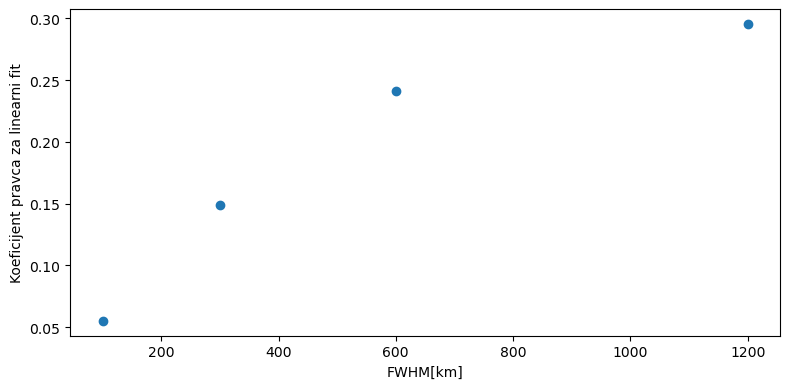

In [81]:
plt.figure(figsize = (8,4))
niz = [m1, m2, m3, m4]
niz2 = [1200, 600, 300, 100]
#plt.suptitle("Promena koeficijenta pravca u zavisnosti od vrednosti FHWM")
plt.scatter(niz2, niz)
plt.ylabel("Koeficijent pravca za linearni fit")
plt.xlabel("FWHM[km]")
plt.tight_layout()
plt.savefig("Nova_analiza_1.png", bbox_inches = 'tight', dpi = 300)

<h1>11. 8. 2024. B<sub>z</sub></h1>

In [82]:
Vx = fits.open("Velocities_TAU_0_1.fits")[1].data # Vy from Velocities.fits as originally thought
Vy = fits.open("Velocities_TAU_0_1.fits")[0].data # Vx from Velocities.fits as originally thought
Vx = Vx.transpose(0, 2, 1)
Vy = Vy.transpose(0, 2, 1)

In [83]:
Vx_mean_sim = temporal_avg(Vx, 0, 90)
Vx_mean_sim = Vx_mean_sim/1E5

Vy_mean_sim = temporal_avg(Vy, 0, 90)
Vy_mean_sim = Vy_mean_sim/1E5

In [84]:
Vx_filtered35 = gaussian_filter(Vx_mean_sim, 35, mode = "wrap")
Vy_filtered35 = gaussian_filter(Vy_mean_sim, 35, mode = "wrap")

In [85]:
Vx_filtered22 = gaussian_filter(Vx_mean_sim, 22.5, mode = "wrap")
Vy_filtered22 = gaussian_filter(Vy_mean_sim, 22.5, mode = "wrap")

In [86]:
Vx_filtered11 = gaussian_filter(Vx_mean_sim, 11.25, mode = "wrap")
Vy_filtered11 = gaussian_filter(Vy_mean_sim, 11.25, mode = "wrap")

In [87]:
Vx_filtered3 = gaussian_filter(Vx_mean_sim, 3.75, mode = "wrap")
Vy_filtered3 = gaussian_filter(Vy_mean_sim, 3.75, mode = "wrap")

In [88]:
Vx_Bz1200 = fits.open("pyFLCT_fwhm_1200_dt_30_Bz_tracked.fits")[0].data
Vy_Bz1200 = fits.open("pyFLCT_fwhm_1200_dt_30_Bz_tracked.fits")[1].data

In [89]:
Vx_Bz600 = fits.open("pyFLCT_fwhm_600_dt_30_Bz_tracked.fits")[0].data
Vy_Bz600 = fits.open("pyFLCT_fwhm_600_dt_30_Bz_tracked.fits")[1].data

In [90]:
Vx_Bz300 = fits.open("pyFLCT_fwhm_300_dt_30_Bz_tracked.fits")[0].data
Vy_Bz300 = fits.open("pyFLCT_fwhm_300_dt_30_Bz_tracked.fits")[1].data

In [91]:
Vx_Bz100 = fits.open("pyFLCT_fwhm_100_dt_30_Bz_tracked.fits")[0].data
Vy_Bz100 = fits.open("pyFLCT_fwhm_100_dt_30_Bz_tracked.fits")[1].data

In [92]:
Vx_FLCT_Bz1200 = temporal_avg(Vx_Bz1200, 0, 90)
Vy_FLCT_Bz1200 = temporal_avg(Vy_Bz1200, 0, 90)

In [93]:
Vx_FLCT_Bz600 = temporal_avg(Vx_Bz600, 0, 90)
Vy_FLCT_Bz600 = temporal_avg(Vy_Bz600, 0, 90)

In [94]:
Vx_FLCT_Bz300 = temporal_avg(Vx_Bz300, 0, 90)
Vy_FLCT_Bz300 = temporal_avg(Vy_Bz300, 0, 90)

In [95]:
Vx_FLCT_Bz100 = temporal_avg(Vx_Bz100, 0, 90)
Vy_FLCT_Bz100 = temporal_avg(Vy_Bz100, 0, 90)

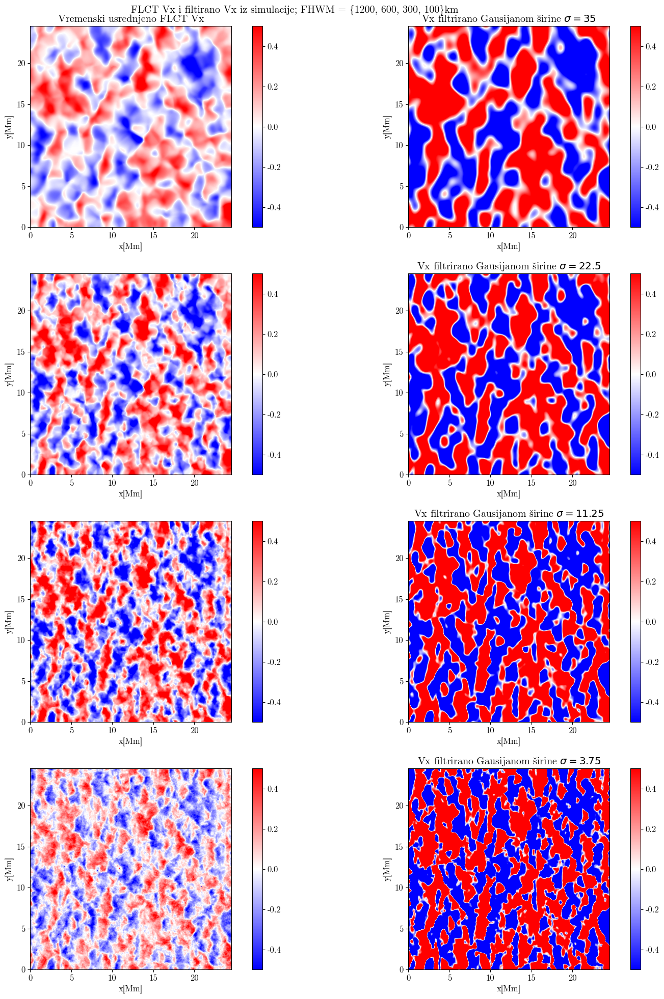

In [103]:
fig = plt.figure(figsize=[16, 20])       
plt.suptitle("FLCT Vx i filtirano Vx iz simulacije; FHWM = {1200, 600, 300, 100}km")# atmos[0] tau

plt.subplot(421)                                      # atmos[1] temp
plt.title("Vremenski usrednjeno FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_Bz1200[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(422)                                      # atmos[1] temp
plt.title("Vx filtrirano Gausijanom širine $\sigma = 35$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered35[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(423)                                      # atmos[1] temp
#plt.title("Time averaged FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_Bz600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(424)
plt.title("Vx filtrirano Gausijanom širine $\sigma = 22.5$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered22[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(425)
#plt.title("Vremenski usrednjeno FLCT Vx")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_Bz300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(426)
plt.title("Vx filtrirano Gausijanom širine $\sigma = 11.25$")
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered11[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(427)                                      # atmos[1] temp
#plt.title("Vremenski usrednjeno FLCT Vx")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_FLCT_Bz100[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

plt.subplot(428)                                      # atmos[1] temp
plt.title("Vx filtrirano Gausijanom širine $\sigma = 3.75$")                                # atmos[2]
plt.xlabel("x[Mm]")
plt.ylabel("y[Mm]")
plt.imshow(Vx_filtered3[:,:], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar()

fig.tight_layout()
plt.savefig("BzALL.png", dpi = 300)

In [96]:
rBz_1200x1 = pearsonr(Vx_Bz1200[0].flatten(), Vx[0].flatten()) 
print(rBz_1200x1)

PearsonRResult(statistic=0.45477103764108245, pvalue=0.0)


In [97]:
rBz_1200y1 = pearsonr(Vy_Bz1200[0].flatten(), Vy[0].flatten()) 
print(rBz_1200y1)

PearsonRResult(statistic=0.4398065686626329, pvalue=0.0)


In [98]:
rBz_1200x2 = pearsonr(Vx_FLCT_Bz1200.flatten(), Vx_mean_sim.flatten())
print(rBz_1200x2)

PearsonRResult(statistic=0.6338198645152414, pvalue=0.0)


In [99]:
rBz_1200y2 = pearsonr(Vy_FLCT_Bz1200.flatten(), Vy_mean_sim.flatten())
print(rBz_1200y2)

PearsonRResult(statistic=0.622432775001956, pvalue=0.0)


In [100]:
rBz_1200x3 = pearsonr(Vx_FLCT_Bz1200.flatten(), Vx_filtered35.flatten())
print(rBz_1200x3)

PearsonRResult(statistic=0.8582435890204058, pvalue=0.0)


In [101]:
rBz_1200y3 = pearsonr(Vy_FLCT_Bz1200.flatten(), Vy_filtered35.flatten())
print(rBz_1200y3)

PearsonRResult(statistic=0.850197431805958, pvalue=0.0)


In [102]:
rBz_600x1 = pearsonr(Vx_Bz600[0].flatten(), Vx[0].flatten()) 
print(rBz_600x1)

PearsonRResult(statistic=0.6166480290378002, pvalue=0.0)


In [103]:
rBz_600y1 = pearsonr(Vy_Bz600[0].flatten(), Vy[0].flatten()) 
print(rBz_600y1)

PearsonRResult(statistic=0.593420165441323, pvalue=0.0)


In [104]:
rBz_600x2 = pearsonr(Vx_FLCT_Bz600.flatten(), Vx_mean_sim.flatten())
print(rBz_600x2)

PearsonRResult(statistic=0.7814975573077281, pvalue=0.0)


In [105]:
rBz_600y2 = pearsonr(Vy_FLCT_Bz600.flatten(), Vy_mean_sim.flatten())
print(rBz_600y2)

PearsonRResult(statistic=0.7828331089096744, pvalue=0.0)


In [106]:
rBz_600x3 = pearsonr(Vx_FLCT_Bz600.flatten(), Vx_filtered22.flatten())
print(rBz_600x3)

PearsonRResult(statistic=0.8929413445711281, pvalue=0.0)


In [107]:
rBz_600y3 = pearsonr(Vy_FLCT_Bz600.flatten(), Vy_filtered22.flatten())
print(rBz_600y3)

PearsonRResult(statistic=0.8973467929409967, pvalue=0.0)


In [108]:
rBz_300x1 = pearsonr(Vx_Bz300[0].flatten(), Vx[0].flatten()) 
print(rBz_300x1)

PearsonRResult(statistic=0.5873361125322596, pvalue=0.0)


In [109]:
rBz_300y1 = pearsonr(Vy_Bz300[0].flatten(), Vy[0].flatten()) 
print(rBz_300y1)

PearsonRResult(statistic=0.4031975101765883, pvalue=0.0)


In [110]:
rBz_300x2 = pearsonr(Vx_FLCT_Bz300.flatten(), Vx_mean_sim.flatten())
print(rBz_300x2)

PearsonRResult(statistic=0.8946988470487098, pvalue=0.0)


In [111]:
rBz_300y2 = pearsonr(Vy_FLCT_Bz300.flatten(), Vy_mean_sim.flatten())
print(rBz_300y2)

PearsonRResult(statistic=0.8901494057432818, pvalue=0.0)


In [112]:
rBz_300x3 = pearsonr(Vx_FLCT_Bz300.flatten(), Vx_filtered11.flatten())
print(rBz_300x3)

PearsonRResult(statistic=0.9326909780607588, pvalue=0.0)


In [113]:
rBz_300y3 = pearsonr(Vy_FLCT_Bz300.flatten(), Vy_filtered11.flatten())
print(rBz_300y3)

PearsonRResult(statistic=0.9287890289396766, pvalue=0.0)


In [114]:
rBz_100x1 = pearsonr(Vx_Bz100[0].flatten(), Vx[0].flatten()) 
print(rBz_100x1)

PearsonRResult(statistic=0.3304123129677459, pvalue=0.0)


In [115]:
rBz_100y1 = pearsonr(Vy_Bz100[0].flatten(), Vy[0].flatten()) 
print(rBz_100y1)

PearsonRResult(statistic=0.4196087034950657, pvalue=0.0)


In [116]:
rBz_100x2 = pearsonr(Vx_FLCT_Bz100.flatten(), Vx_mean_sim.flatten())
print(rBz_100x2)

PearsonRResult(statistic=0.11366095310891972, pvalue=0.0)


In [117]:
rBz_100y2 = pearsonr(Vy_FLCT_Bz100.flatten(), Vy_mean_sim.flatten())
print(rBz_100y2)

PearsonRResult(statistic=0.12491447751206561, pvalue=0.0)


In [118]:
rBz_100x3 = pearsonr(Vx_FLCT_Bz100.flatten(), Vx_filtered3.flatten())
print(rBz_100x3)

PearsonRResult(statistic=0.11410077792320414, pvalue=0.0)


In [119]:
rBz_100y3 = pearsonr(Vy_FLCT_Bz100.flatten(), Vy_filtered3.flatten())
print(rBz_100y3)

PearsonRResult(statistic=0.12532986389819478, pvalue=0.0)


/tmp/ipykernel_4777/3561015857.py:105: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig("ALLBz_comp_srb.png", bbox_inches = "tight", dpi = 50)


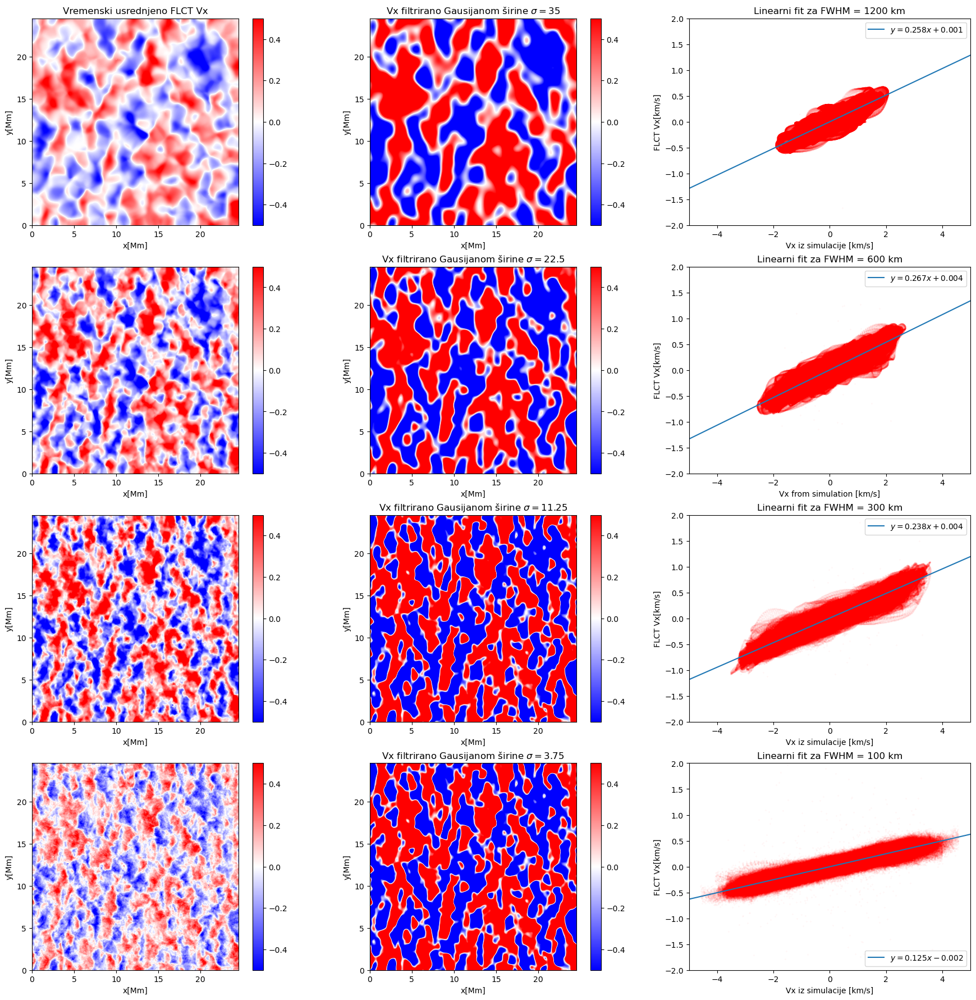

In [120]:
plt.figure(figsize = (22,22))
#plt.suptitle("Poređenje FLCT Vx i filtrirane Vx iz simulacije za FHWM = {1200, 600, 300, 100}km")
# 4x3 plot, velicina A, velicina B, scatter A i B!!!
ax1 = plt.subplot2grid((4,3), (0,0))
ax1.set_title("Vremenski usrednjeno FLCT Vx")
ax1.set_xlabel("x[Mm]")
ax1.set_ylabel("y[Mm]")
im1 = ax1.imshow(Vx_FLCT_Bz1200[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im1)

ax2 = plt.subplot2grid((4,3), (0,1))
ax2.set_title("Vx filtrirano Gausijanom širine $\sigma = 35$")
ax2.set_xlabel("x[Mm]")
ax2.set_ylabel("y[Mm]")
im2 = ax2.imshow(Vx_filtered35[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im2)

ax3 = plt.subplot2grid((4,3), (0,2))
ax3.set_title("Linearni fit za FWHM = 1200 km")                                
ax3.set_ylabel("FLCT Vx[km/s]")
ax3.set_xlabel("Vx iz simulacije [km/s]")
ax3.set_xlim(-5,5)
ax3.set_ylim(-2,2)
ax3.scatter(Vx_filtered35.flatten(), Vx_FLCT_Bz1200.flatten(), s = 0.001, color="red")
m1, b1, *_ = linregress(Vx_filtered35.flatten(), Vx_FLCT_Bz1200.flatten())
ax3.axline(xy1=(0, b1), slope=m1, label=f'$y = {m1:.3f}x {b1:+.3f}$')
plt.legend()

ax4 = plt.subplot2grid((4,3), (1,0))
#ax4.set_title("Time averaged FLCT Vx")
ax4.set_xlabel("x[Mm]")
ax4.set_ylabel("y[Mm]")
im4 = ax4.imshow(Vx_FLCT_Bz600[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im4)

ax5 = plt.subplot2grid((4,3), (1,1))
ax5.set_title("Vx filtrirano Gausijanom širine $\sigma = 22.5$")
ax5.set_xlabel("x[Mm]")
ax5.set_ylabel("y[Mm]")
im5 = ax5.imshow(Vx_filtered22[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im5)

ax6 = plt.subplot2grid((4,3), (1,2))
ax6.set_title("Linearni fit za FWHM = 600 km")                                
ax6.set_ylabel("FLCT Vx[km/s]")
ax6.set_xlabel("Vx from simulation [km/s]")
ax6.set_xlim(-5,5)
ax6.set_ylim(-2,2)
ax6.scatter(Vx_filtered22.flatten(), Vx_FLCT_Bz600.flatten(), s = 0.001, color="red")
m2, b2, *_ = linregress(Vx_filtered22.flatten(), Vx_FLCT_Bz600.flatten())
ax6.axline(xy1=(0, b2), slope=m2, label=f'$y = {m2:.3f}x {b2:+.3f}$')
plt.legend()

ax7 = plt.subplot2grid((4,3), (2,0))
#ax7.set_title("Time averaged FLCT Vx")
ax7.set_xlabel("x[Mm]")
ax7.set_ylabel("y[Mm]")
im7 = ax7.imshow(Vx_FLCT_Bz300[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im7)

ax8 = plt.subplot2grid((4,3), (2,1))
ax8.set_title("Vx filtrirano Gausijanom širine $\sigma = 11.25$")
ax8.set_xlabel("x[Mm]")
ax8.set_ylabel("y[Mm]")
im8 = ax8.imshow(Vx_filtered11[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im8)

ax9 = plt.subplot2grid((4,3), (2,2))
ax9.set_title("Linearni fit za FWHM = 300 km")                                
ax9.set_ylabel("FLCT Vx[km/s]")
ax9.set_xlabel("Vx iz simulacije [km/s]")
ax9.set_xlim(-5,5)
ax9.set_ylim(-2,2)
ax9.scatter(Vx_filtered11.flatten(), Vx_FLCT_Bz300.flatten(), s = 0.001, color="red")
m3, b3, *_ = linregress(Vx_filtered11.flatten(), Vx_FLCT_Bz300.flatten())
ax9.axline(xy1=(0, b3), slope=m3, label=f'$y = {m3:.3f}x {b2:+.3f}$')
plt.legend()

ax10 = plt.subplot2grid((4,3), (3,0))
#ax10.set_title("Time averaged FLCT Vx")
ax10.set_xlabel("x[Mm]")
ax10.set_ylabel("y[Mm]")
im10 = ax10.imshow(Vx_FLCT_Bz100[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im10)

ax11 = plt.subplot2grid((4,3), (3,1))
ax11.set_title("Vx filtrirano Gausijanom širine $\sigma = 3.75$")
ax11.set_xlabel("x[Mm]")
ax11.set_ylabel("y[Mm]")
im11 = ax11.imshow(Vx_filtered11[:, :], origin='lower', cmap = "bwr", extent = (0, 24.536, 0, 24.536), vmin = -0.5, vmax = 0.5)
plt.colorbar(im11)

ax12 = plt.subplot2grid((4,3), (3,2))
ax12.set_title("Linearni fit za FWHM = 100 km")                                
ax12.set_ylabel("FLCT Vx[km/s]")
ax12.set_xlabel("Vx iz simulacije [km/s]")
ax12.set_xlim(-5,5)
ax12.set_ylim(-2,2)
ax12.scatter(Vx_filtered3.flatten(), Vx_FLCT_Bz100.flatten(), s = 0.001, color="red")
m4, b4, *_ = linregress(Vx_filtered3.flatten(), Vx_FLCT_Bz100.flatten())
ax12.axline(xy1=(0, b4), slope=m4, label=f'$y = {m4:.3f}x {b4:+.3f}$')
plt.legend()

fig.tight_layout()
plt.savefig("ALLBz_comp_srb.png", bbox_inches = "tight", dpi = 50)

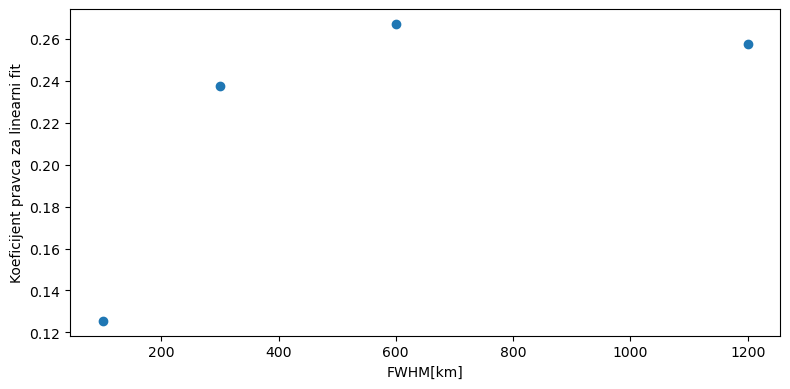

In [121]:
plt.figure(figsize = (8,4))
niz = [m1, m2, m3, m4]
niz2 = [1200, 600, 300, 100]
#plt.suptitle("Promena koeficijenta pravca u zavisnosti od vrednosti FHWM")
plt.scatter(niz2, niz)
plt.ylabel("Koeficijent pravca za linearni fit")
plt.xlabel("FWHM[km]")
plt.tight_layout()
plt.savefig("Nova_analizaBy.png", bbox_inches = 'tight', dpi = 300)

In [316]:
x = statsmodels.api.add_constant(Vx_filtered3.flatten())
result = statsmodels.api.OLS(Vx_FLCT_Bz100.flatten(), x).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                 3.112e+04
Date:                Tue, 13 Aug 2024   Prob (F-statistic):               0.00
Time:                        15:45:06   Log-Likelihood:            -4.5304e+06
No. Observations:             2359296   AIC:                         9.061e+06
Df Residuals:                 2359294   BIC:                         9.061e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0017      0.001     -1.618      0.1

In [317]:
linregress(Vx_filtered3.flatten(), Vx_FLCT_Bz100.flatten())

LinregressResult(slope=0.12548364565802425, intercept=-0.0017419065366516377, rvalue=0.11410077792320396, pvalue=0.0, stderr=0.0007113148731158853, intercept_stderr=0.0010765211340885868)

In [154]:
# Creating the input arrays
image1 = np.zeros((10, 10))
image1[0:3, 0:3] = 1

image2 = np.zeros((10, 10))
image2[1:4, 1:4] = 1



In [155]:
vel_x, vel_y, vm = pyflct.flct(image1, image2, 1, 1, 2.3)

flct: nominal sliding box size = 4
flct: mean value of gamma^2/sigma^2 = 0.163926

flct: finished


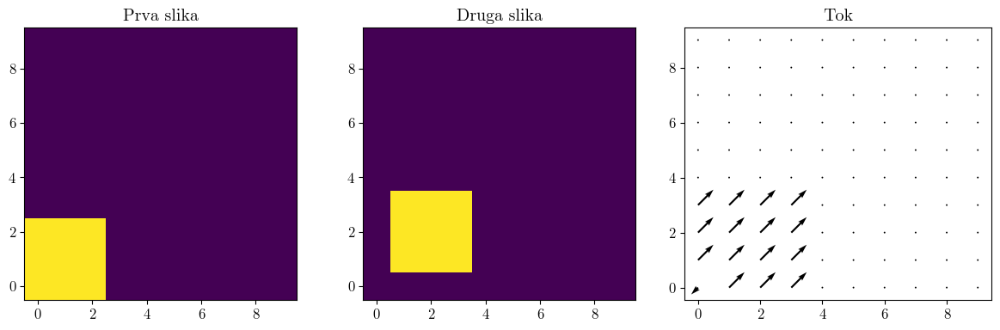

In [157]:
# But first we need to create a meshgrid on which the flow field will be plotted
X = np.arange(0, 10, 1)
Y = np.arange(0, 10, 1)
U, V = np.meshgrid(X, Y)

# Plotting the first image
fig = plt.figure(figsize=(12, 4))

ax1 = fig.add_subplot(131)
plt.imshow(image1, origin="lower")
ax1.set_title("Prva slika")

# Plot the shifted image
ax3 = fig.add_subplot(132)
plt.imshow(image2, origin="lower")
ax3.set_title("Druga slika")

# Plot the 2D flow field
ax2 = fig.add_subplot(133)
ax2.quiver(U, V, vel_x, vel_y, scale = 20)
ax2.set_title("Tok")

fig.tight_layout()
plt.savefig("Primer2.png", bbox_inches = "tight", dpi = 100)

<h2>26. 8. 2024. $\chi^2$</h2>

In [87]:
diff_1 = Vy_Bz1200[0, :, :] - Vy[0, :, :]/1E5
MSE_1 = diff_1/precision
MSE_1 = MSE_1**2
chi_1 = np.mean(MSE_1)
print(chi_1)

16.89947856555756


In [88]:
diff_2 = Vy_FLCT_Bz1200[:, :] - Vy_mean_sim[:, :]
MSE_2 = diff_2/precision
MSE_2 = MSE_2**2
chi_2 = np.mean(MSE_2)
print(chi_2)

8.497976684555347


In [89]:
diff_3 = Vy_FLCT_Bz1200[:, :] - Vy_filtered35[:, :]
MSE_3 = diff_3/precision
MSE_3 = MSE_3**2
chi_3 = np.mean(MSE_3)
print(chi_3)

1.1600728349900338


In [90]:
diff_4 = Vy_Bz600[0, :, :] - Vy[0, :, :]/1E5
MSE_4 = diff_4/precision
MSE_4 = MSE_4**2
chi_4 = np.mean(MSE_4)
print(chi_4)

15.308059130757206


In [91]:
diff_5 = Vy_FLCT_Bz600[:, :] - Vy_mean_sim[:, :]
MSE_5 = diff_5/precision
MSE_5 = MSE_5**2
chi_5 = np.mean(MSE_5)
print(chi_5)

7.476244083156309


In [92]:
diff_6 = Vy_FLCT_Bz600[:, :] - Vy_filtered22[:, :]
MSE_6 = diff_6/precision
MSE_6 = MSE_6**2
chi_6 = np.mean(MSE_6)
print(chi_6)

2.097666627749036


In [93]:
diff_7 = Vy_Bz300[0, :, :] - Vy[0, :, :]/1E5
MSE_7 = diff_7/precision
MSE_7 = MSE_7**2
chi_7 = np.mean(MSE_7)
print(chi_7)

15.731560805167756


In [94]:
diff_8 = Vy_FLCT_Bz300[:, :] - Vy_mean_sim[:, :]
MSE_8 = diff_8/precision
MSE_8 = MSE_8**2
chi_8 = np.mean(MSE_8)
print(chi_8)

6.641704427805389


In [95]:
diff_9 = Vy_FLCT_Bz300[:, :] - Vy_filtered11[:, :]
MSE_9 = diff_9/precision
MSE_9 = MSE_9**2
chi_9 = np.mean(MSE_9)
print(chi_9)

4.030883513187756


In [96]:
diff_10 = Vy_Bz100[0, :, :] - Vy[0, :, :]/1E5
MSE_10 = diff_10/precision
MSE_10 = MSE_10**2
chi_10 = np.mean(MSE_10)
print(chi_10)

15.950150084703788


In [97]:
diff_11 = Vy_FLCT_Bz100[:, :] - Vy_mean_sim[:, :]
MSE_11 = diff_11/precision
MSE_11 = MSE_11**2
chi_11 = np.mean(MSE_11)
print(chi_11)

16.76142846439023


In [98]:
diff_12 = Vy_FLCT_Bz100[:, :] - Vy_filtered3[:, :]
MSE_12 = diff_12/precision
MSE_12 = MSE_12**2
chi_12 = np.mean(MSE_12)
print(chi_12)

16.23980814271058
